In [1]:
import os
import monai
import torch
import torch.nn as nn
import torch.optim as optim
from monai.networks.nets import UNet
from monai.data import DataLoader, CacheDataset, ImageDataset, Dataset, image_reader
from monai.data.utils import pad_list_data_collate
from monai.transforms import Compose, ScaleIntensity, ToTensor,LoadImaged, ScaleIntensityd, ToTensord,EnsureChannelFirstd
import SimpleITK as sitk
from monai.data.image_reader import ITKReader
from monai.losses import DiceLoss
from monai.metrics import MSEMetric
import dataset
from dataset import PelvisDataset
import numpy as np
import sklearn
from monai.metrics import compute_hausdorff_distance
from UNETR import UNETR



2023-11-27 16:42:08.819379: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-27 16:42:09.729170: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


# crop images

P_1765645_GIN.nrrd


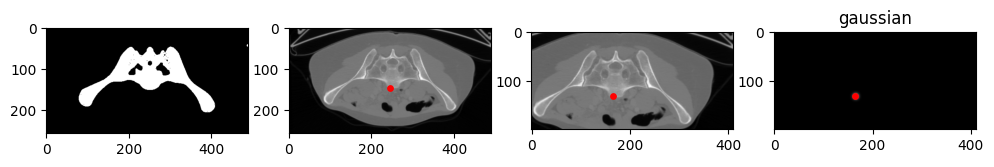

P_1572096_ANTROP.nrrd


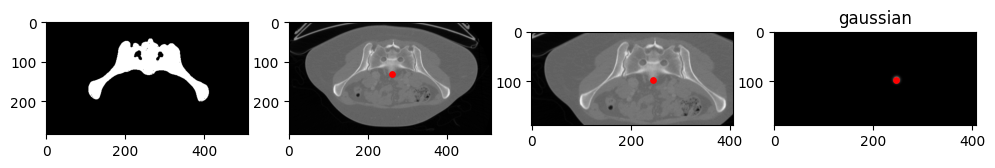

P_10535603_GIN.nrrd


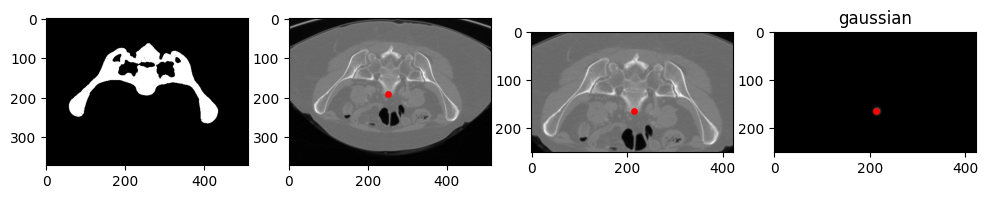

P_808211848_GIN.nrrd


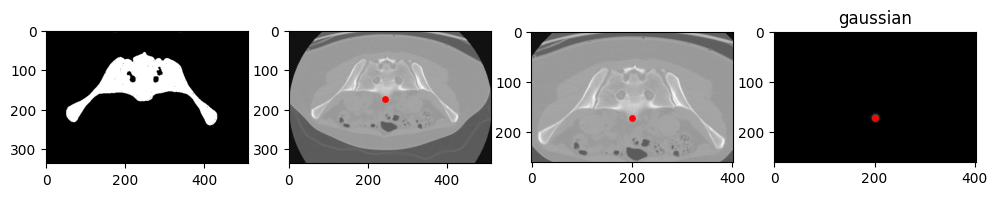

P_10061362_GIN.nrrd


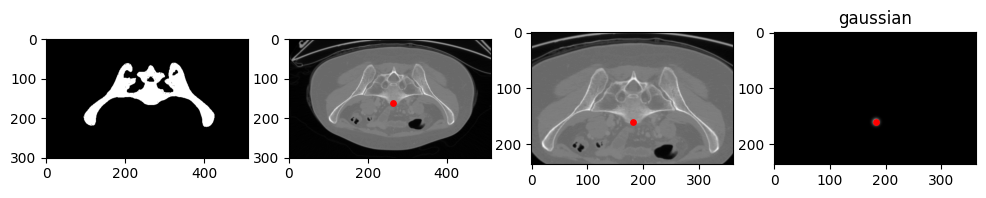

P_10279644_ANTROP.nrrd


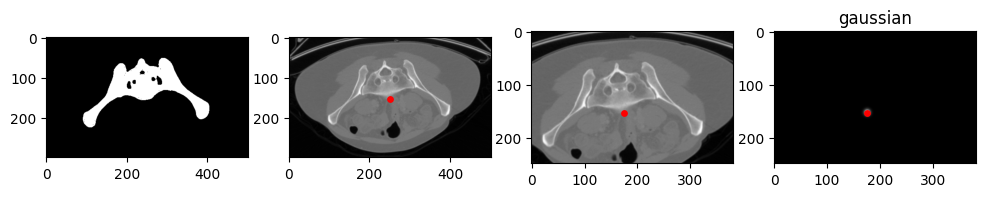

P_2066635_ANTRO.nrrd


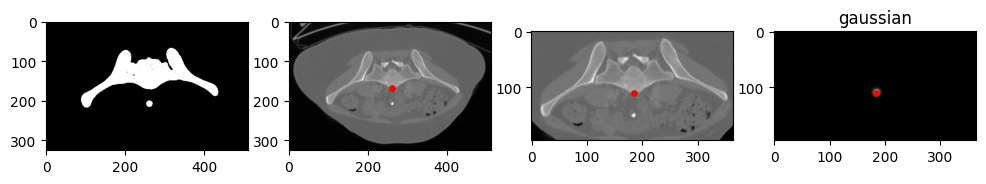

P_2197057_ANTROP.nrrd


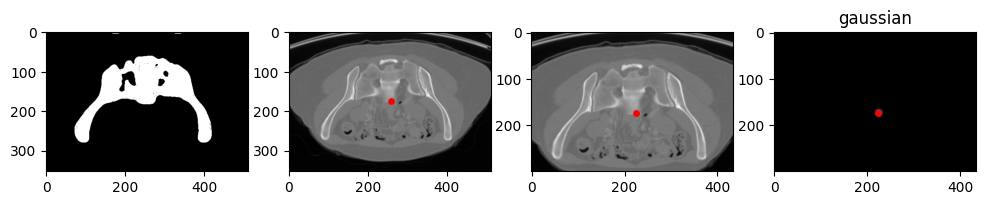

P_2043819_ANDRO.nrrd


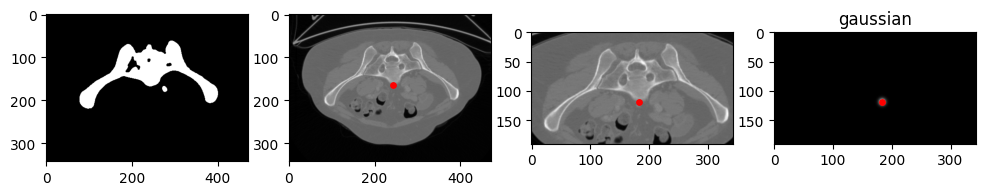

P_1195472_ANTROP.nrrd


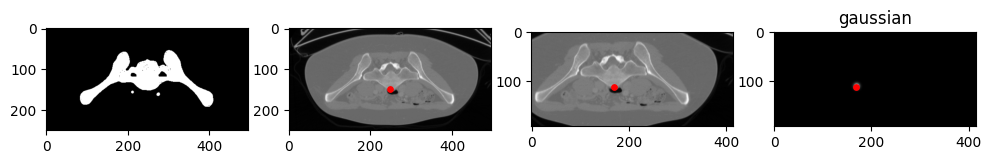

P_1165093_ANTROP.nrrd


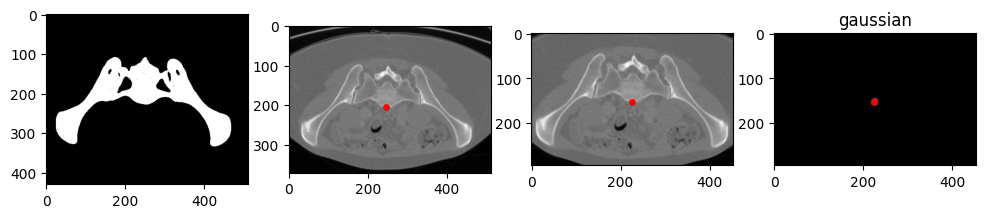

P_10182352_GIN.nrrd


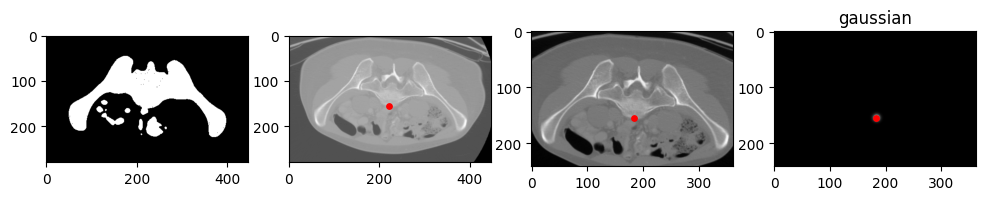

P_2241943_ANTROP.nrrd


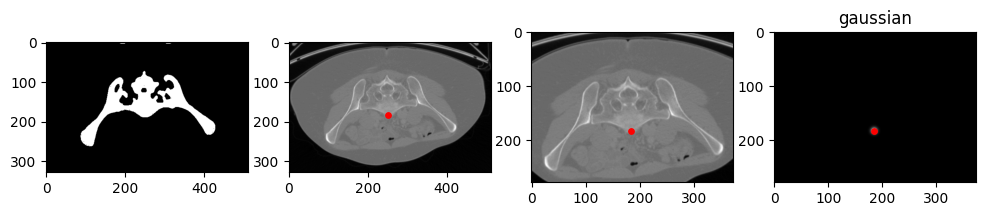

P_840104562_ANTROP.nrrd


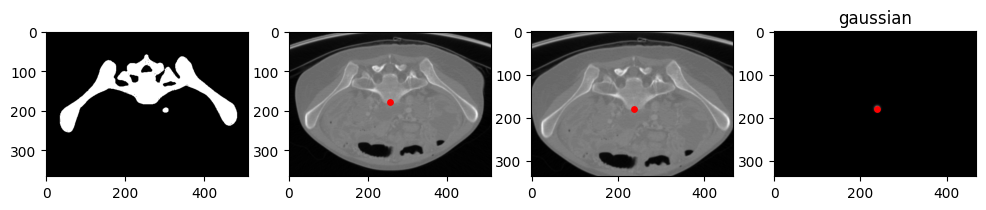

P_2418993_GIN.nrrd


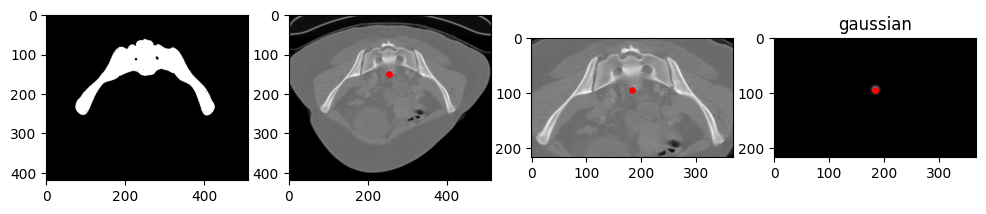

P_840114360_ANTROP.nrrd


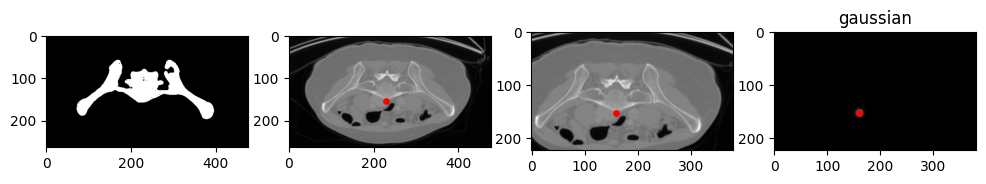

P_802351174_ANTROP.nrrd


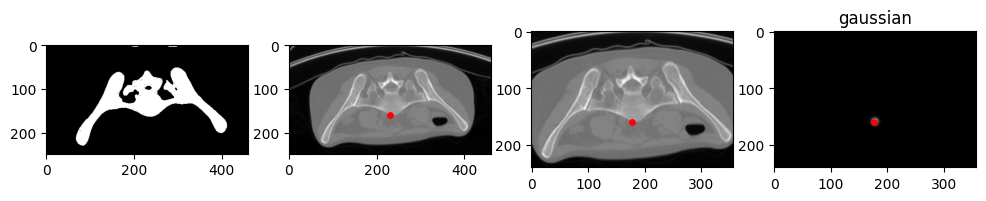

P_2379678_ANTROP.nrrd


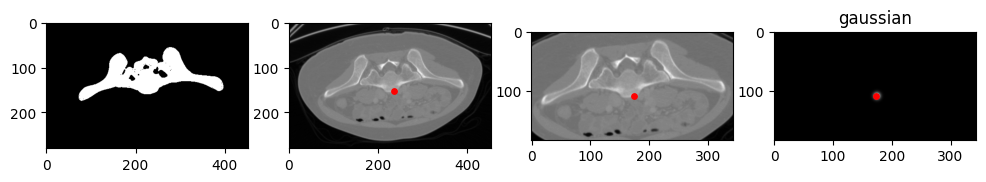

P_10253637_ANTROP.nrrd


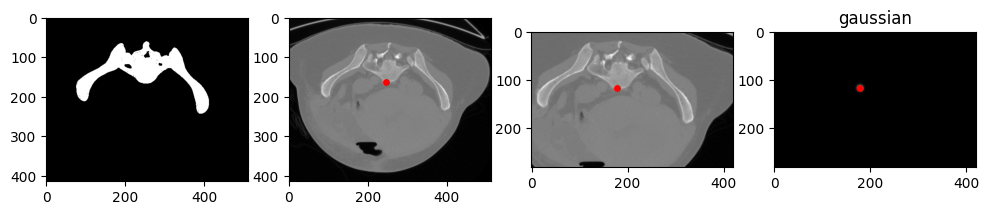

P_10265450_ANTROP.nrrd


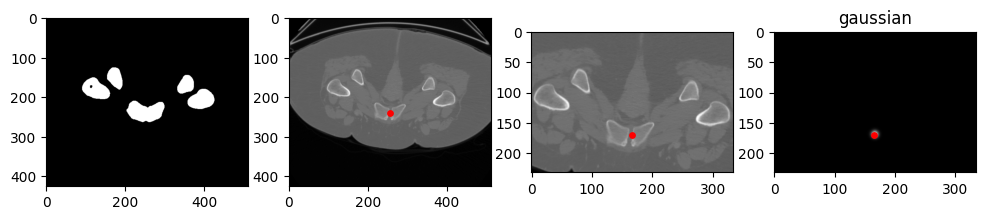

P_1480679_ANTROP.nrrd


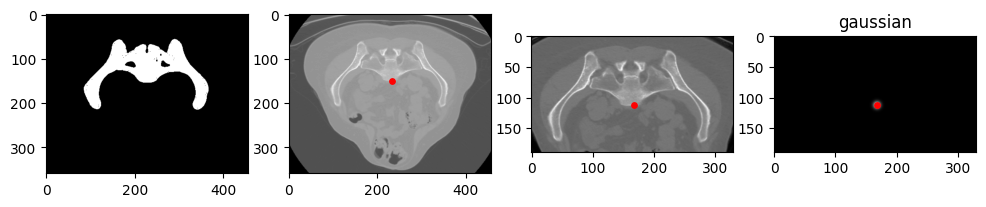

P_2387418_GIN.nrrd


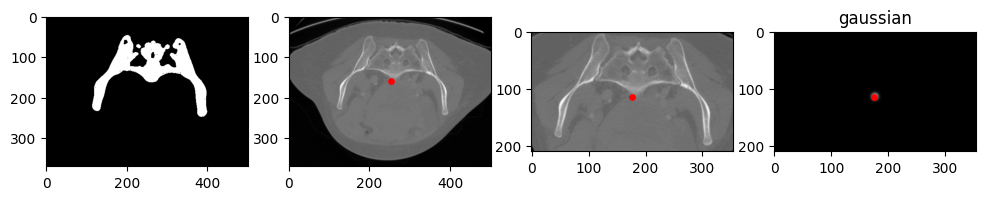

P_10208792_ANDRO.nrrd


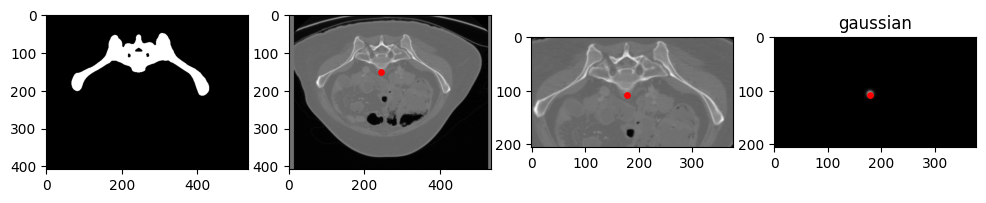

P_10190176_ANTROP.nrrd


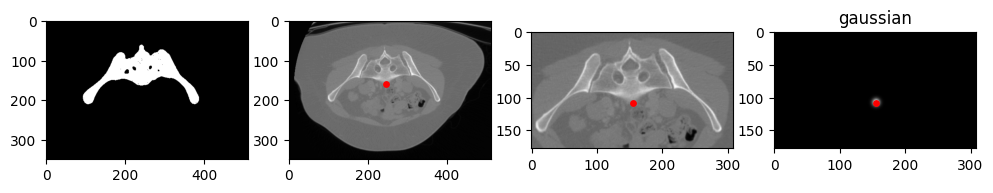

P_2111864_ANTROP.nrrd


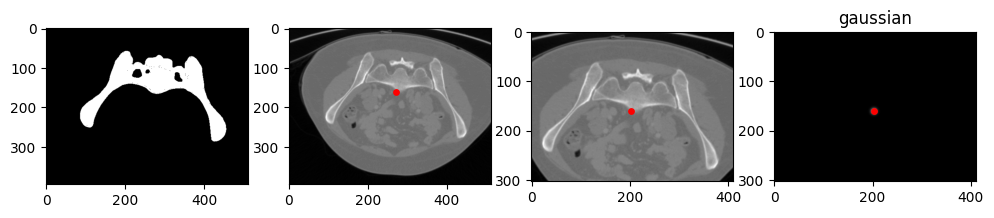

P_1571575_GIN.nrrd


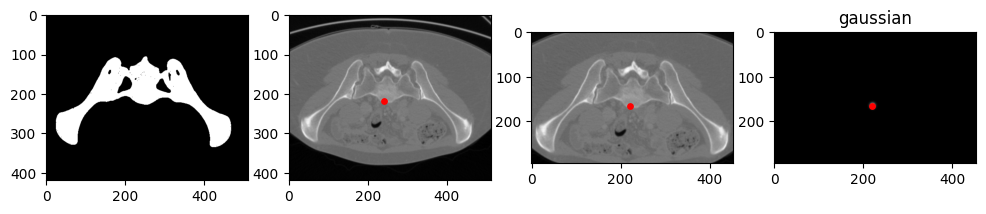

P_10055401_GIN.nrrd


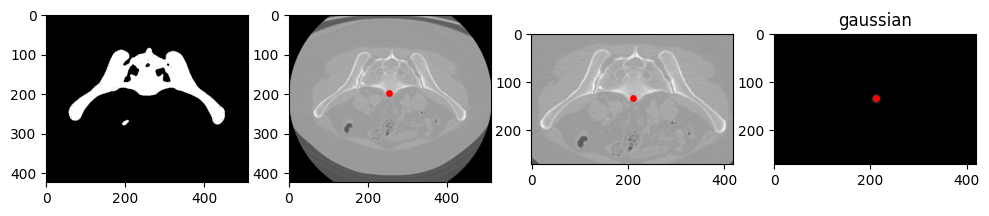

P_1715822_ANTROP.nrrd


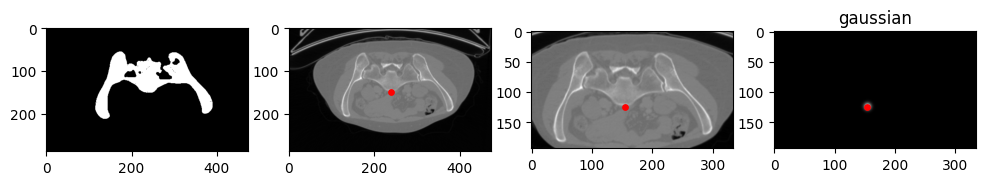

P_840121405_GIN.nrrd


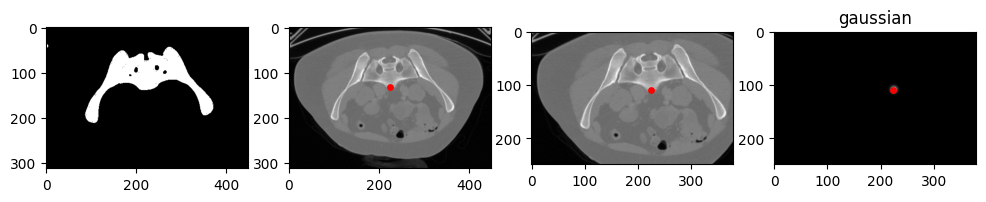

P_1683063_ANTROP.nrrd


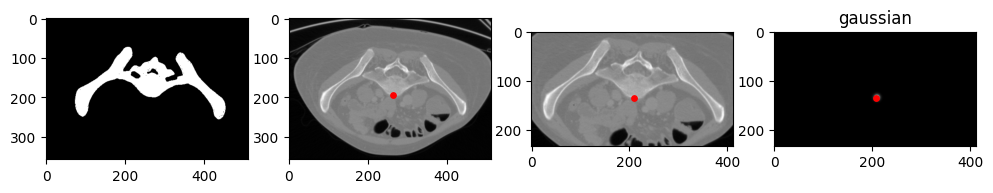

P_1683587_ANTROP.nrrd


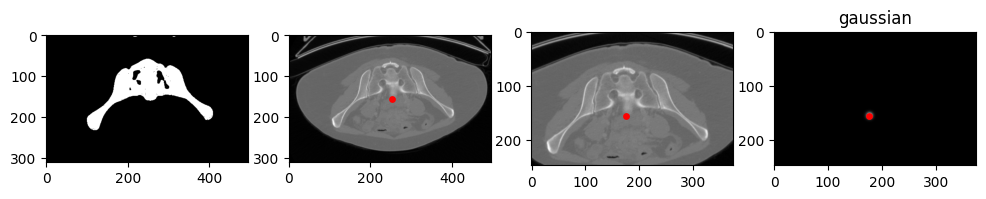

P_2370576_GIN.nrrd


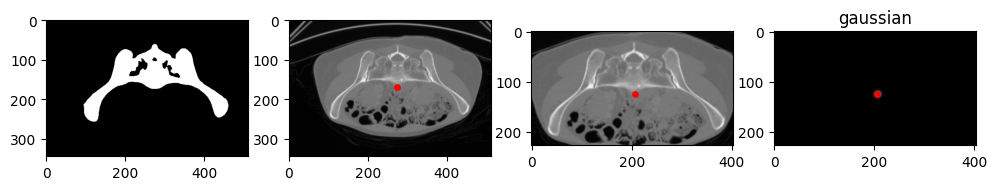

P_840248498_ANTROP.nrrd


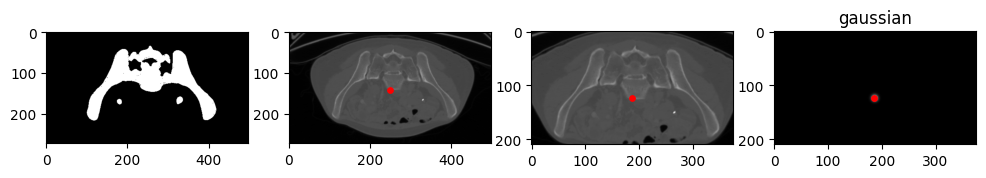

P_10390193_GIN.nrrd


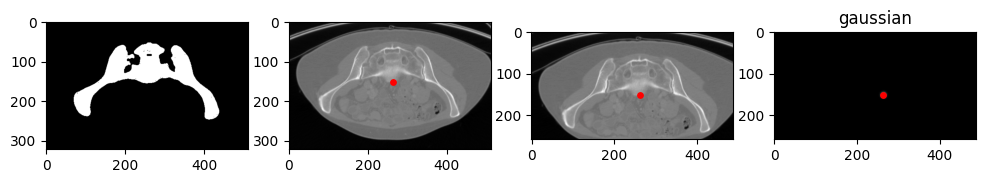

P_1905095_GIN.nrrd


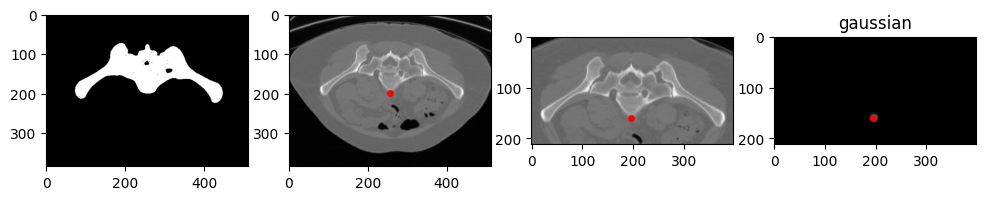

P_2002362_ANTROP.nrrd


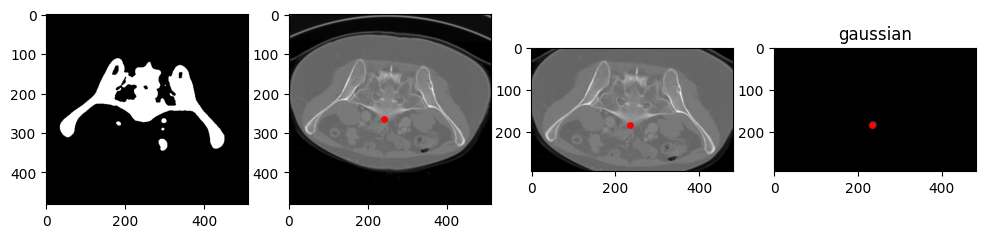

P_1132495_ANTROP.nrrd


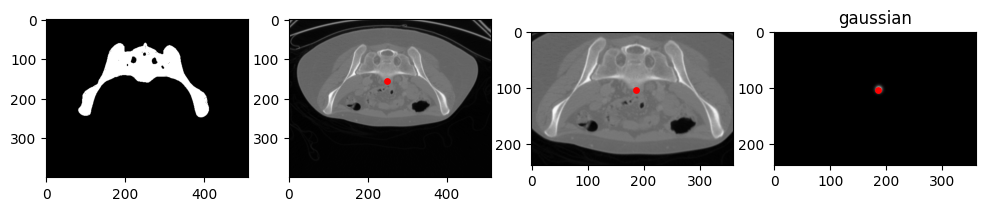

P_1444487_ANTROP.nrrd


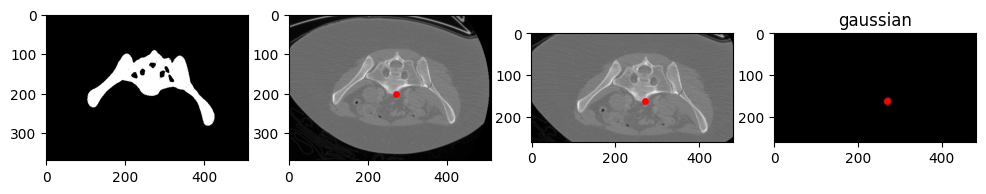

P_1716840_ANTROP.nrrd


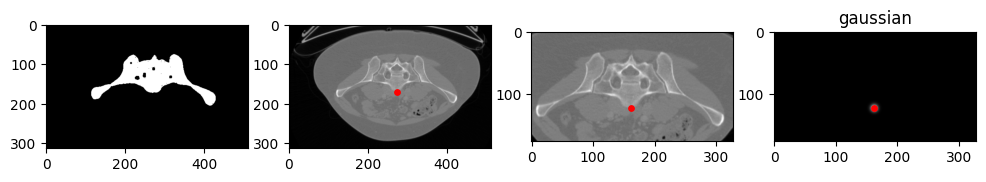

P_1825137_PLATI.nrrd


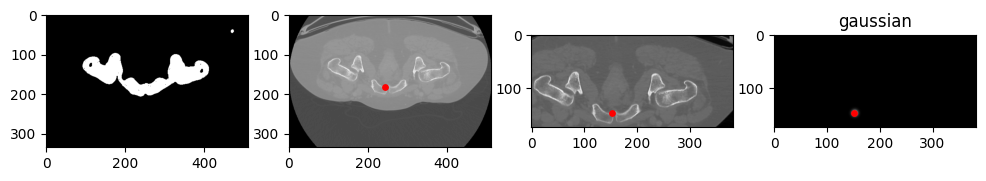

P_2369281_ANTROP.nrrd


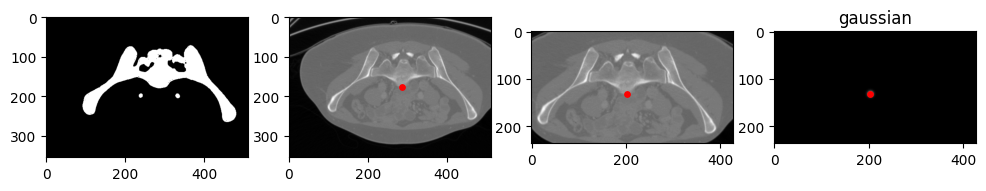

P_2319187_GIN.nrrd


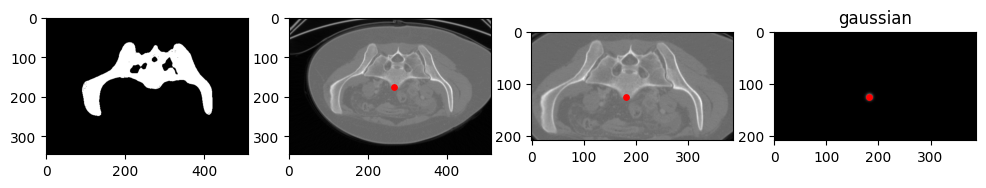

P_1993084_ANTROP.nrrd


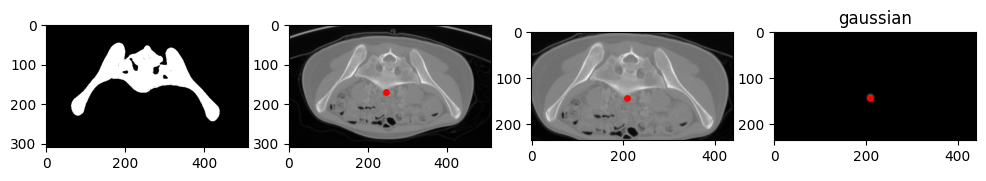

P_1612231_GIN.nrrd


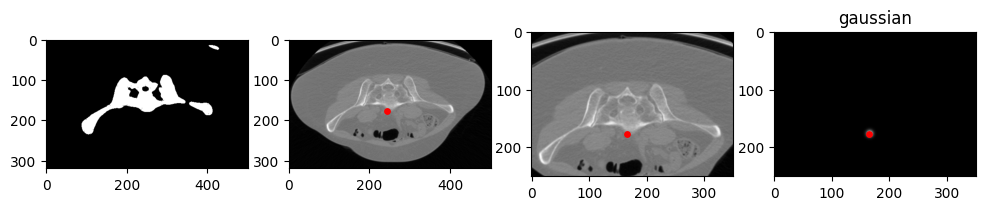

P_2146763_GIN.nrrd


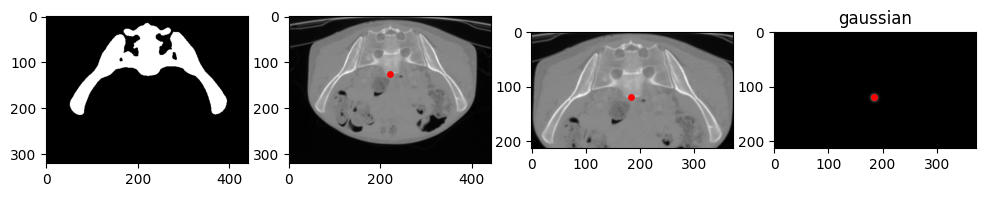

P_2039080_GIN.nrrd


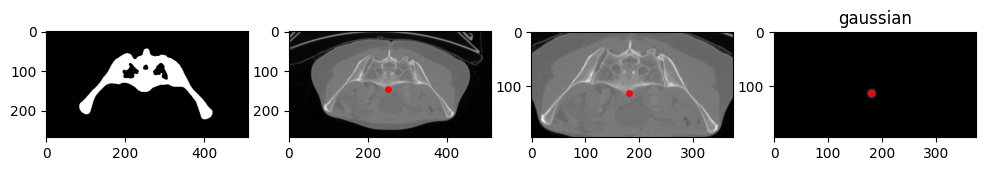

P_10550586_ANTROP.nrrd


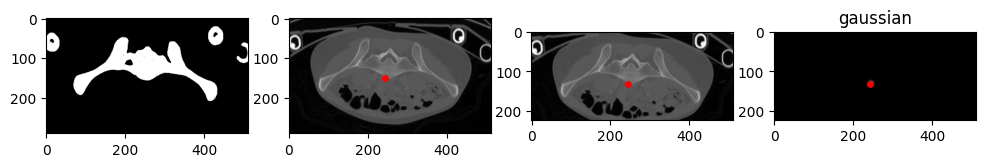

P_1427769_GIN.nrrd


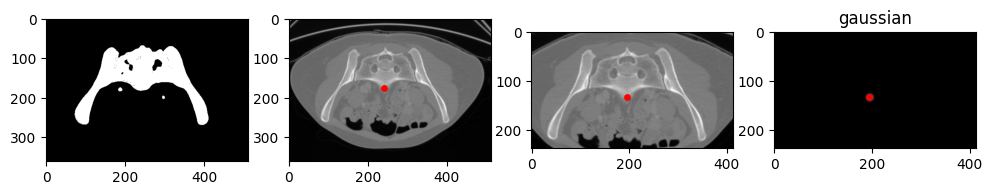

P_10292632_ANTROP.nrrd


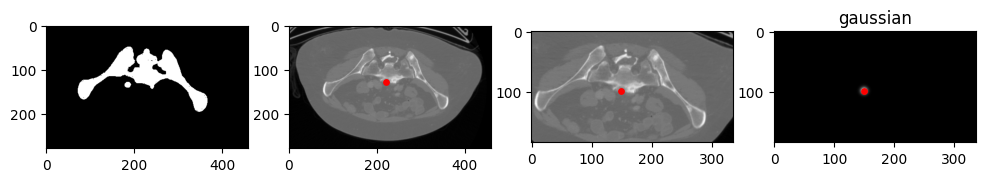

P_2156592_ANTROP.nrrd


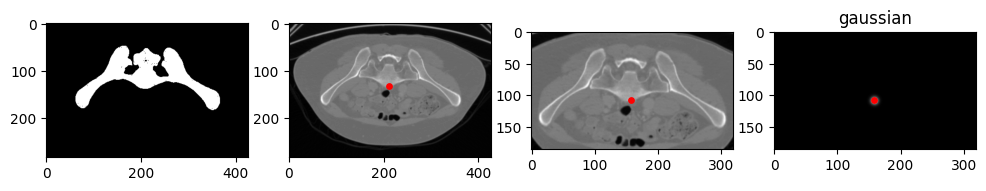

P_10860322_GIN.nrrd


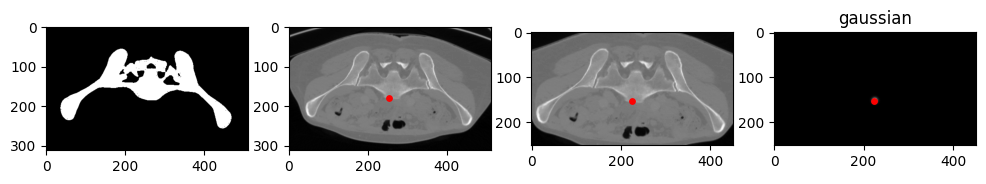

P_2196069_ANTROP.nrrd


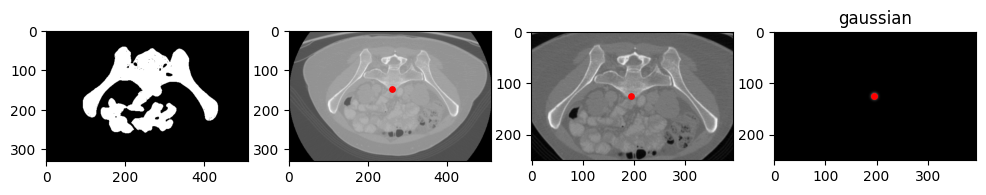

P_1874278_GIN.nrrd


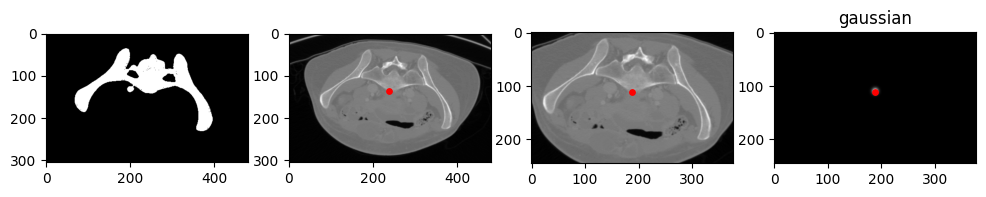

P_840109842_GIN.nrrd


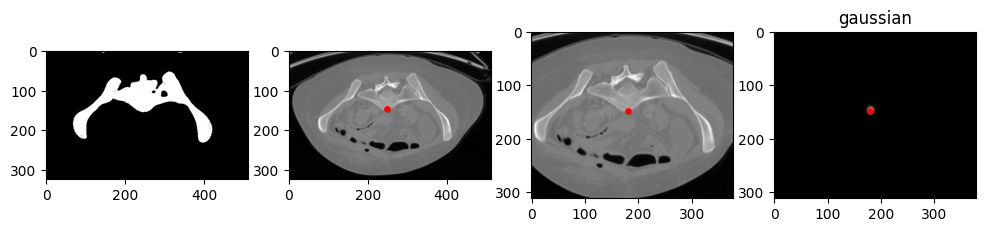

P_808704728_ANTROP.nrrd


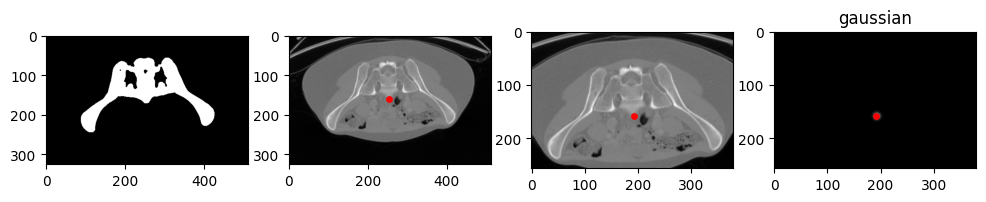

P_10255365_GIN.nrrd


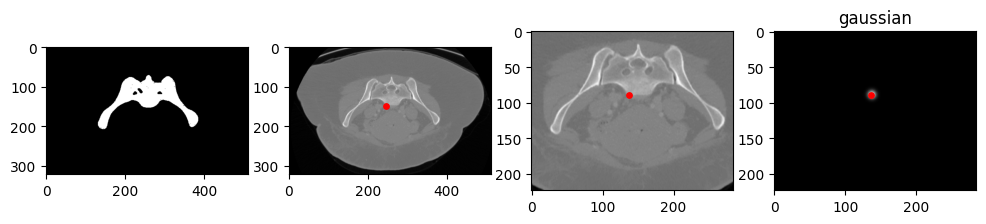

P_10273428_GIN.nrrd


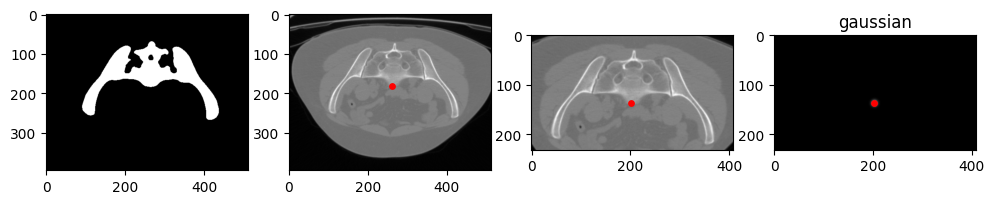

P_1663679_ANTROP.nrrd


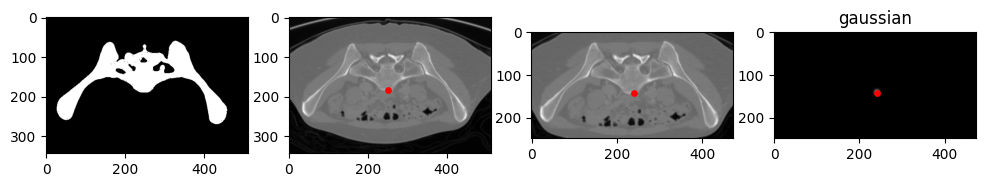

P_2046474_GIN.nrrd


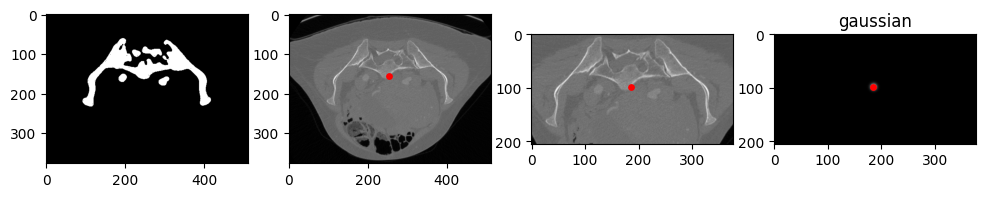

P_1796248_ANTROP.nrrd


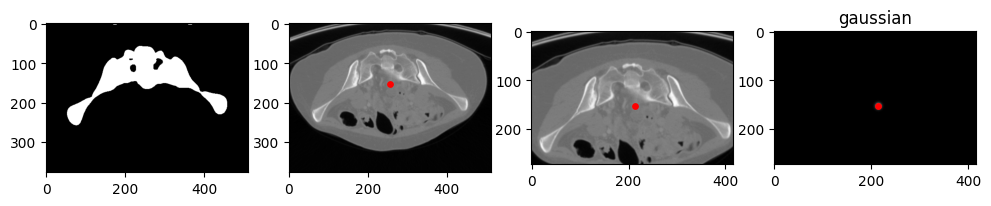

P_10240629_GIN.nrrd


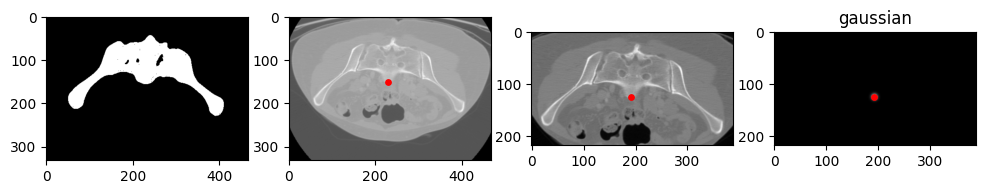

P_840131653_ANDRO.nrrd


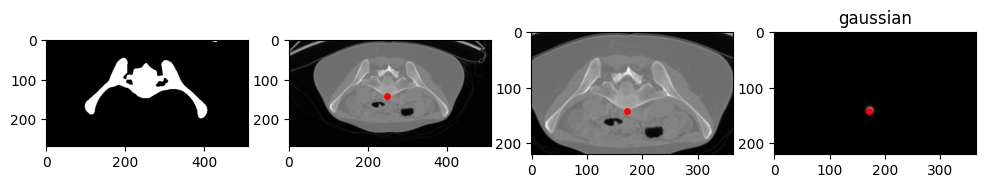

P_2089803_GIN.nrrd


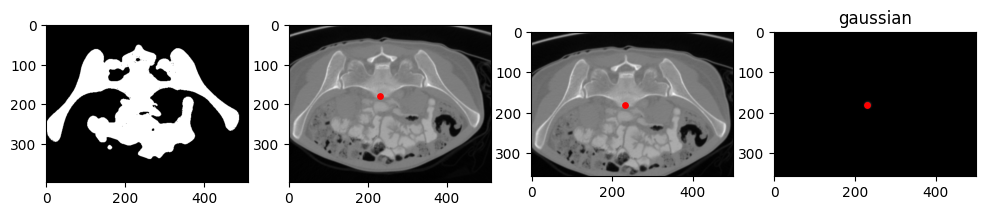

P_2114245_GIN.nrrd


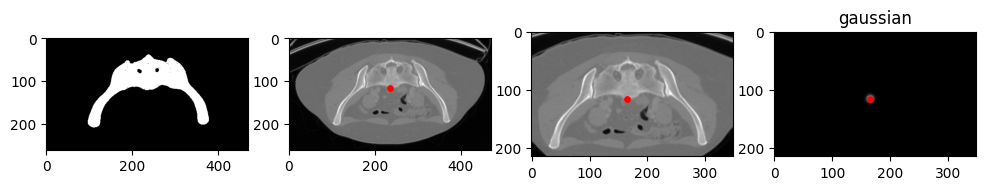

P_808475095_GIN.nrrd


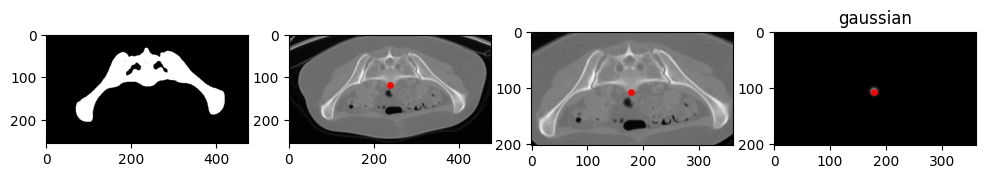

P_2133072_GIN.nrrd


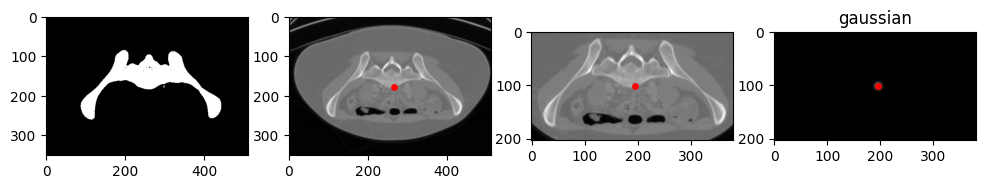

P_10643160_ANTROP.nrrd


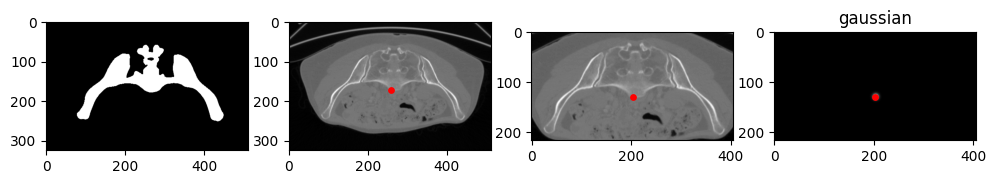

P_80411795_ANDRO.nrrd


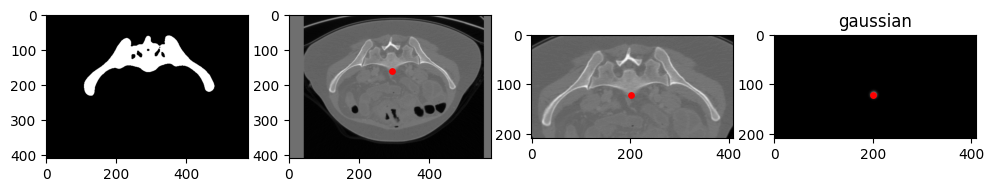

P_840057000_ANTROP.nrrd


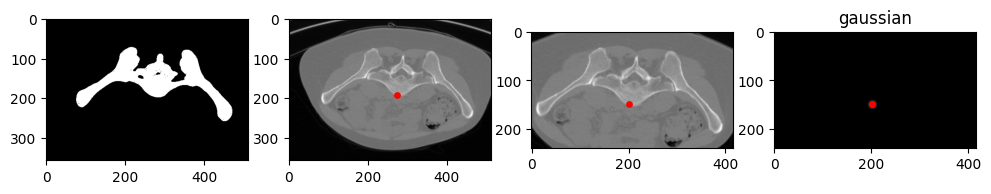

P_1059692_ANTROP.nrrd


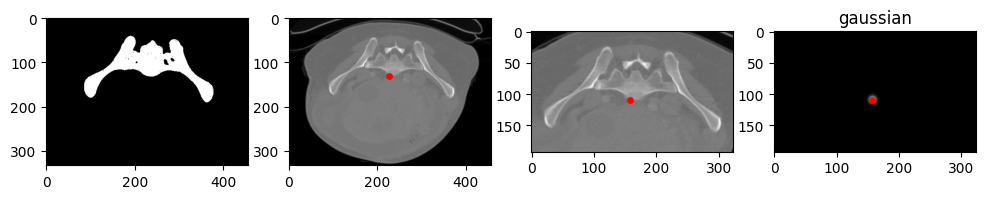

P_10040985_GIN.nrrd


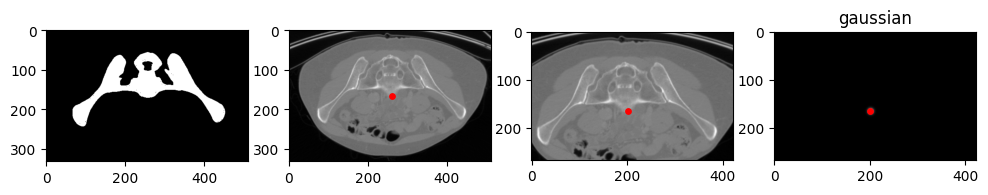

P_2207042_ANTROP.nrrd


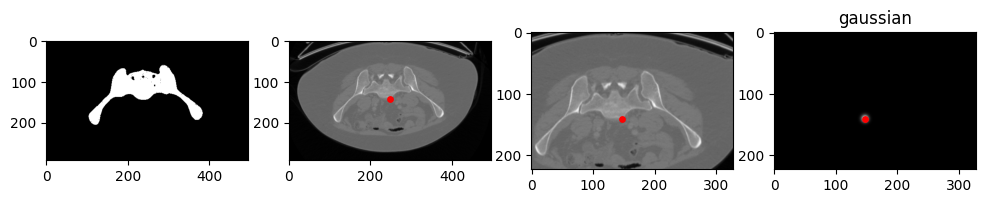

P_808761105_PLATI.nrrd


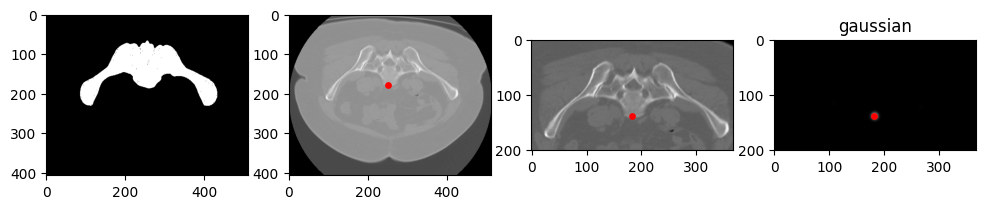

P_2170236-GIN.nrrd


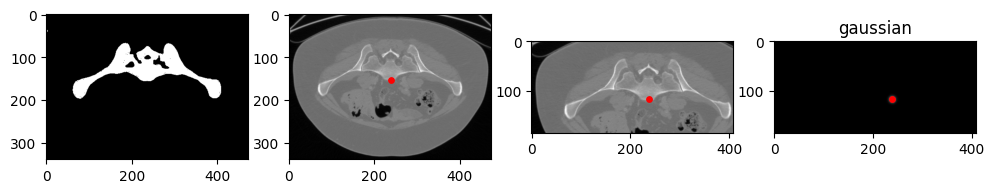

P_10034664_GIN.nrrd


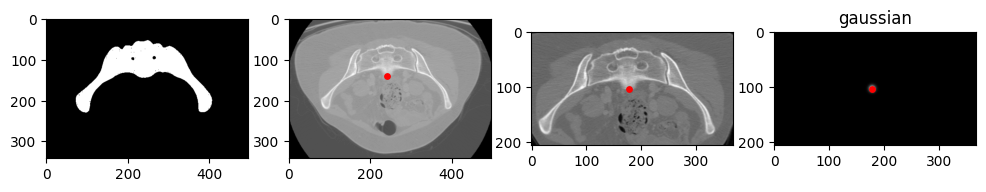

In [2]:
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt

def crop_nonzero(image):
    # Encuentra las coordenadas de los píxeles no nulos
    nonzero_rows, nonzero_cols, nonzero_planes = np.nonzero(image)

    # Encuentra los límites del cuadro no nulo
    min_row, max_row = np.min(nonzero_rows), np.max(nonzero_rows)
    min_col, max_col = np.min(nonzero_cols), np.max(nonzero_cols)
    min_plane, max_plane = np.min(nonzero_planes), np.max(nonzero_planes)

    # Recorta la imagen según los límites encontrados
    cropped_image = image[min_row:max_row+1, min_col:max_col+1, min_plane:max_plane+1]
    # cropped_gaussian = gaussian[min_row:max_row+1, min_col:max_col+1, min_plane:max_plane+1]
    return cropped_image

def gaussian_3d(shape, center, sigma = 4):
    x = np.arange(0, shape[0], 1, float)
    y = np.arange(0, shape[1], 1, float)
    z = np.arange(0, shape[2], 1, float)
    

    x, y, z = np.meshgrid(x, y, z)
    
    gaussian = np.exp(-((x - center[0])**2 + (y - center[1])**2 + (z - center[2])**2) / (2 * sigma**2))

    return gaussian / np.max(gaussian)

def crop_original_image(original_image_path, masked_image_path,landmarks_folder, gaussian_image_path, output_path, save_landmarks_folder):
    image_list = os.listdir(original_image_path)
    mask_list = os.listdir(masked_image_path)
    # Cargar las imágenes originales y de máscara
    for i in range(len(image_list)):
        image_file = image_list[i]
        landmarks_filename = f"{os.path.splitext(image_file)[0]}_landmarks.txt"
        landmarks_path = os.path.join(landmarks_folder, landmarks_filename)
        
        if (image_file != "padded" and image_file!="padded_landmarks" and image_file!="padded_gaussians"):  
            
            original_image = sitk.ReadImage(original_image_path + image_list[i] ,sitk.sitkFloat32) 
            print(image_file)
            landmarks = np.loadtxt(landmarks_path)
            masked_filename = f"{os.path.splitext(image_file)[0]}_mask_image.nrrd"
            
            masked_image = sitk.ReadImage(masked_image_path + masked_filename,sitk.sitkFloat32)
            im_Arr = sitk.GetArrayFromImage(original_image)
            # min_value = im_Arr.min()
            # max_value = im_Arr.max()
            # normalized_array = (im_Arr - min_value) / (im_Arr - min_value)
            # im_Arr = normalized_array
            
            # Obtener los datos de la imagen de máscara
            mask_array = sitk.GetArrayFromImage(masked_image)
            mask_array[mask_array != 0] = 1

            cropped_image_2 = crop_nonzero(mask_array)

            cropped_masked_image = sitk.GetImageFromArray(cropped_image_2)
            # Encontrar las coordenadas del rectángulo que rodea la máscara
            # bounding_box = np.argwhere(cropped_image_2 > 0)
            mask_array = sitk.GetArrayFromImage(masked_image)
            mask_array[mask_array != 0] = 1

            cropped_image_2 = crop_nonzero(mask_array)

            # Encontrar las coordenadas del rectángulo que rodea la máscara
            bounding_box = np.argwhere(mask_array > 0)
            min_coords = bounding_box.min(axis=0)
            max_coords = bounding_box.max(axis=0)

            # Recortar la región de interés de la imagen original
            cropped_array = im_Arr[min_coords[0]:max_coords[0] + 1,
                                        min_coords[1]:max_coords[1] + 1,
                                        min_coords[2]:max_coords[2] + 1]
            
            # Crear una nueva imagen recortada
            cropped_image = sitk.GetImageFromArray(cropped_array)
            cropped_image.SetSpacing(original_image.GetSpacing())
            cropped_image.SetOrigin(original_image.GetOrigin())
            
            origin = np.array(original_image.GetOrigin())
            spacing = np.array(original_image.GetSpacing())    
            
            direction_matrix = np.array(original_image.GetDirection()).reshape((3,3))

            coordinates = []
            padded_coordinates = []
            
            # Crear una imagen para mostrar las gaussianas
            gaussian_image = np.zeros(cropped_image.GetSize())

            for landmark in landmarks:
                # print(landmark)
                coordinate = np.round(np.linalg.inv(direction_matrix).dot(landmark - origin) / spacing).astype(int)
                coordinate = abs(coordinate) 
                coordinates.append(coordinate.tolist())
                
                # Obtener la nueva posición de los landmarks después del relleno
                landmarks_after_padding = coordinate - np.array([min_coords[2], min_coords[1], min_coords[0]])
                padded_coordinates.append(landmarks_after_padding.tolist())

                
                gaussian = gaussian_3d(cropped_image.GetSize(), landmarks_after_padding.tolist())
                gaussian = np.transpose(gaussian, (1,0,2))
                
                gaussian_image += gaussian
        
            gaussian_image = np.transpose(gaussian_image, (2,1,0))
            sitk.WriteImage(sitk.GetImageFromArray(gaussian_image), gaussian_image_path +image_file )
            np.savetxt(save_landmarks_folder + landmarks_filename, padded_coordinates)
        
            
            plt.figure(figsize=(12, 6))
                    
            plt.subplot(1, 4, 1)
            plt.imshow( (mask_array[coordinate[2],:,:]),cmap="gray")
            
            plt.subplot(1, 4, 2)
            plt.scatter(coordinate[0], coordinate[1], s=15, c='red', marker='o')
            plt.imshow( (im_Arr[coordinate[2],:,:]),cmap="gray")
            plt.subplot(1, 4, 3)
            plt.scatter(landmarks_after_padding[0], landmarks_after_padding[1], s=15, c='red', marker='o')
            plt.imshow(sitk.GetArrayFromImage(cropped_image)[int(coordinate[2]), :,:], cmap='gray')
            
            plt.subplot(1, 4, 4)
            plt.scatter(landmarks_after_padding[0], landmarks_after_padding[1], s=15, c='red', marker='o')
            
            plt.imshow(gaussian_image[int(coordinate[2]), :,:], cmap='gray')
            plt.title('gaussian')
            plt.show()
            
            # cropped_image = sitk.GetImageFromArray(cropped_array)
            
            sitk.WriteImage(cropped_image, output_path + image_list[i])
            
        
    
    # Guardar la imagen recortada en formato NRRD
    

# Ejemplo de uso
data_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/"
original_image_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/"
masked_image_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/MASKED_IMAGES/"
gaussian_image_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_gaussians/"
landmarks_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/LANDMARKS/"
output_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/Cropped_images/"
save_landmarks_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_landmarks/"

crop_original_image(original_image_path, masked_image_path, landmarks_folder, gaussian_image_path, output_path, save_landmarks_folder)


# padding

In [100]:
import SimpleITK as sitk
import os
import numpy as np
import matplotlib.pyplot as plt

def get_maximum_size(image_folder):
    # Obtener la lista de archivos en la carpeta de imágenes
    image_files = os.listdir(image_folder)
    
    # Inicializar el tamaño máximo con el tamaño de la primera imagen
    first_image_path = os.path.join(image_folder, image_files[0])
    first_image = sitk.ReadImage(first_image_path,sitk.sitkFloat32)
    max_size = np.array(first_image.GetSize())

    # Iterar sobre las imágenes y encontrar el tamaño máximo
    for image_file in image_files:
        if (image_file != "padded" and image_file!="padded_landmarks" and image_file!="padded_gaussians"):
            image_path = os.path.join(image_folder, image_file)
            
            image = sitk.ReadImage(image_path,sitk.sitkFloat32)
            size = np.array(image.GetSize())
            max_size = np.maximum(max_size, size)

    return max_size.tolist()


def pad_images(image_folder, output_folder,gaussians_save):
    # Obtener el tamaño máximo necesario para el relleno
    max_size = get_maximum_size(image_folder)
    print('max size',max_size)
    # Iterar sobre las imágenes y aplicar el relleno
    for image_file in os.listdir(image_folder):
        # print(image_file)
        image_path = os.path.join(image_folder, image_file)
        
        if (image_file != "padded" and image_file!="padded_landmarks" and image_file!="padded_gaussians"): 
            print(image_file)
            # Leer la imagen con SimpleITK
            image = sitk.ReadImage(image_path,sitk.sitkFloat32)
            gaussian = sitk.ReadImage(gaussians_save + image_file, sitk.sitkFloat32)

            # Obtener el tamaño actual de la imagen
            current_size = np.array(image.GetSize())

            # Calcular la cantidad de relleno necesario
            padding_size = max_size - current_size
            
            # Aplicar el relleno
            # padding_size = np.maximum(padding_size - current_size, 0)
            
            # Compute the amount of padding needed for each dimension
            pad_x = int(padding_size[0])
            pad_y = int(padding_size[1])
            pad_z = int(padding_size[2])

            # Define the amount of padding for each side of the image
            lower_pad = (pad_x//2, pad_y//2, pad_z//2)
            upper_pad = (pad_x - lower_pad[0], pad_y - lower_pad[1], pad_z - lower_pad[2])
            
            # Create the filter for zero-padding the image
            padding_filter = sitk.ConstantPadImageFilter()

            # Set the padding value to 0
            padding_value = 0

            # Apply the padding filter to the input image
            padded_image = sitk.ConstantPad(image, lower_pad, upper_pad, padding_value)
            padded_image.SetOrigin(image.GetOrigin())
            padded_gaussian = sitk.ConstantPad(gaussian, lower_pad, upper_pad, padding_value)
            padded_gaussian.SetOrigin(gaussian.GetOrigin())
            
            # Guardar la imagen con relleno en la carpeta de salida
            output_path = os.path.join(output_folder, image_file)
            sitk.WriteImage(padded_image, output_path)
            sitk.WriteImage(padded_gaussian, gaussians_save + image_file)
            
image_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded/"
output_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded/"
gaussians_save = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_gaussians/"
pad_images(image_folder, output_folder,gaussians_save)

max size [170, 118, 226]
P_1765645_GIN.nrrd
P_1572096_ANTROP.nrrd
P_10535603_GIN.nrrd
P_808211848_GIN.nrrd
P_10061362_GIN.nrrd
P_10279644_ANTROP.nrrd
P_2066635_ANTRO.nrrd
P_2197057_ANTROP.nrrd
P_2043819_ANDRO.nrrd
P_1195472_ANTROP.nrrd
P_1165093_ANTROP.nrrd
P_10182352_GIN.nrrd
P_2241943_ANTROP.nrrd
P_840104562_ANTROP.nrrd
P_2418993_GIN.nrrd
P_840114360_ANTROP.nrrd
P_802351174_ANTROP.nrrd
P_2379678_ANTROP.nrrd
P_10253637_ANTROP.nrrd
P_10265450_ANTROP.nrrd
P_1480679_ANTROP.nrrd
P_2387418_GIN.nrrd
P_10208792_ANDRO.nrrd
P_10190176_ANTROP.nrrd
P_2111864_ANTROP.nrrd
P_1571575_GIN.nrrd
P_10055401_GIN.nrrd
P_1715822_ANTROP.nrrd
P_840121405_GIN.nrrd
P_1683063_ANTROP.nrrd
P_1683587_ANTROP.nrrd
P_2370576_GIN.nrrd
P_840248498_ANTROP.nrrd
P_10390193_GIN.nrrd
P_1905095_GIN.nrrd
P_2002362_ANTROP.nrrd
P_1132495_ANTROP.nrrd
P_1444487_ANTROP.nrrd
P_1716840_ANTROP.nrrd
P_1825137_PLATI.nrrd
P_2369281_ANTROP.nrrd
P_2319187_GIN.nrrd
P_1993084_ANTROP.nrrd
P_1612231_GIN.nrrd
P_2146763_GIN.nrrd
P_2039080_GIN.n

P_1765645_GIN.nrrd


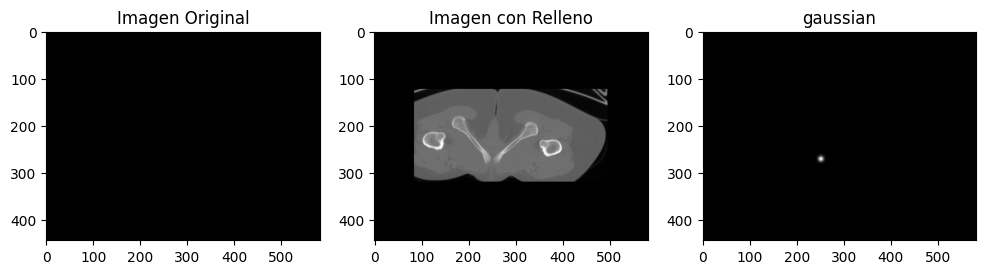

P_1572096_ANTROP.nrrd


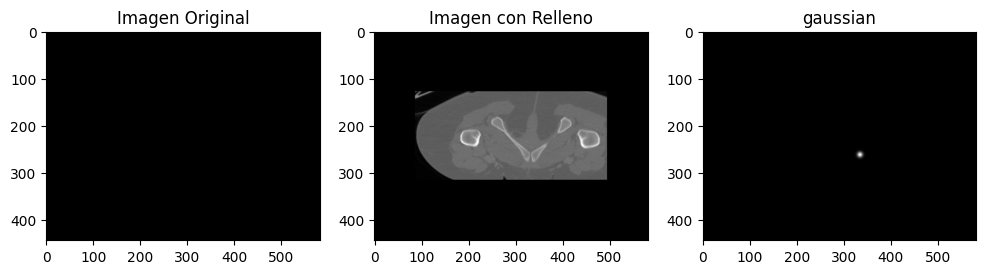

P_10535603_GIN.nrrd


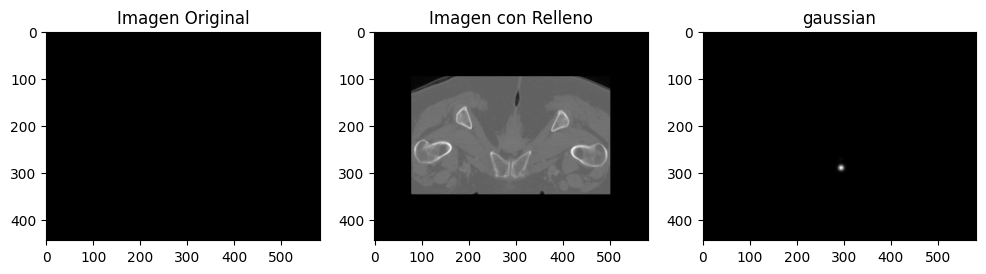

P_808211848_GIN.nrrd


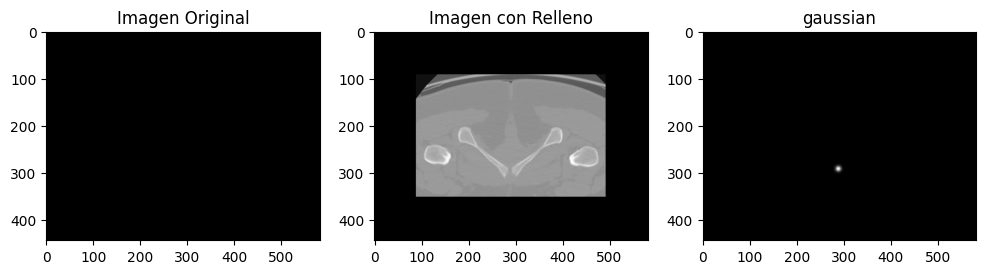

P_10061362_GIN.nrrd


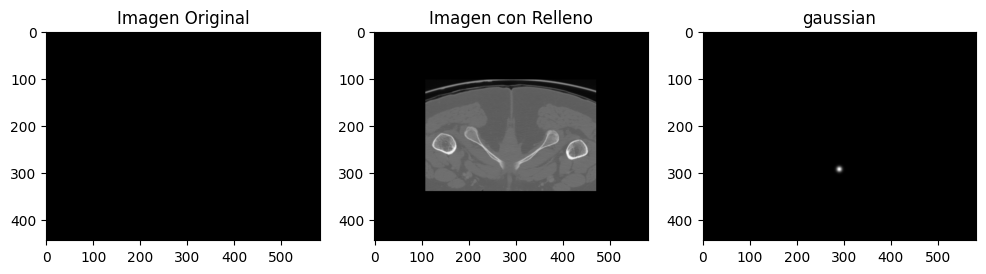

P_10279644_ANTROP.nrrd


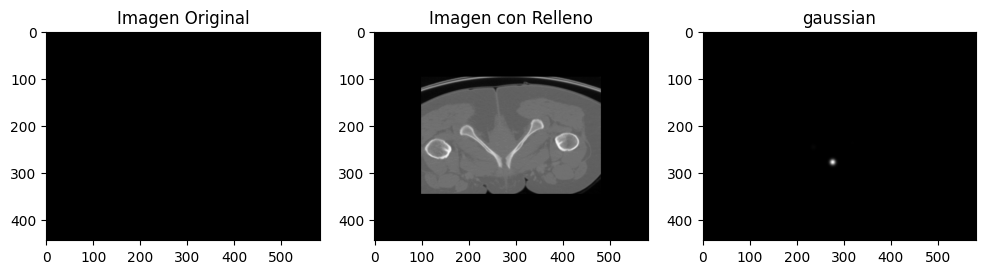

P_2066635_ANTRO.nrrd


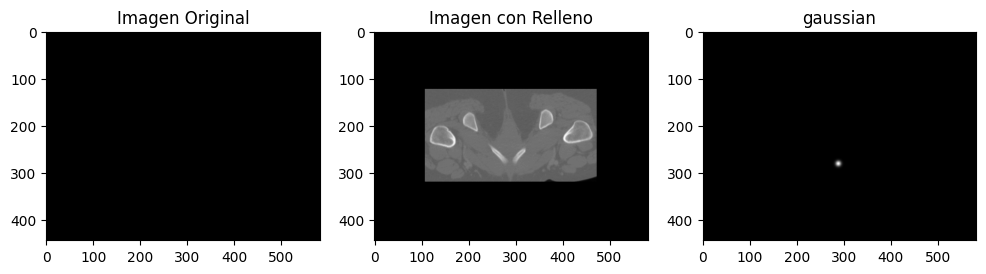

P_2197057_ANTROP.nrrd


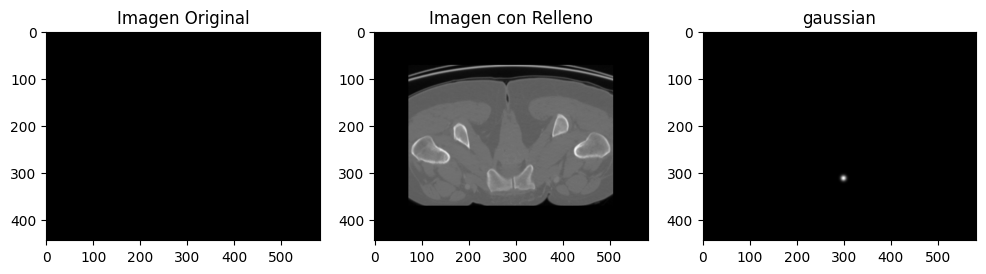

P_2043819_ANDRO.nrrd


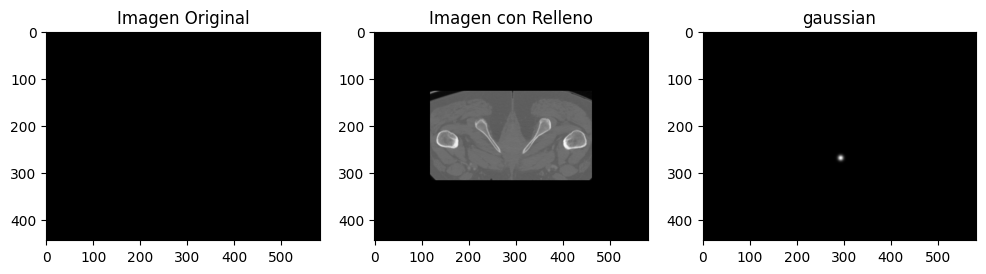

P_1195472_ANTROP.nrrd


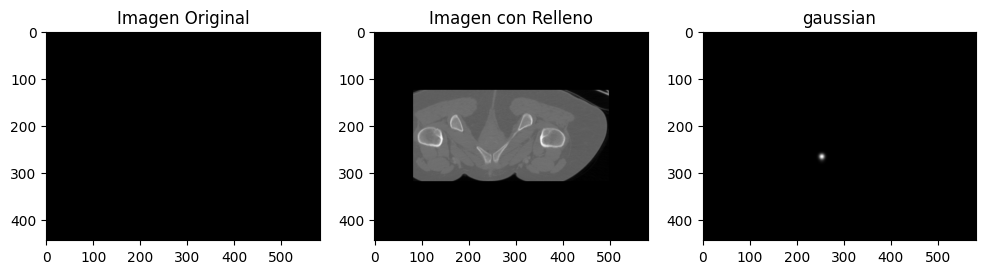

P_1165093_ANTROP.nrrd


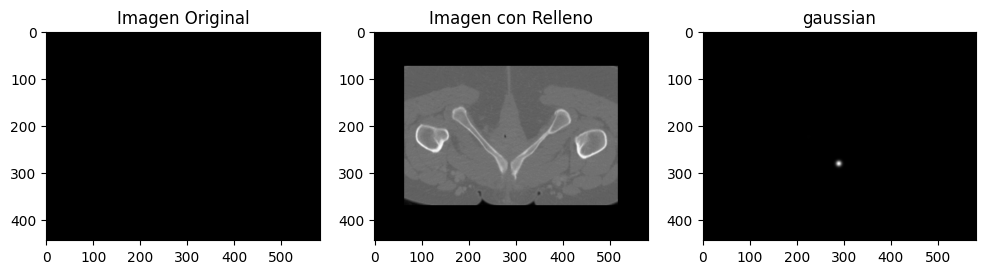

P_10182352_GIN.nrrd


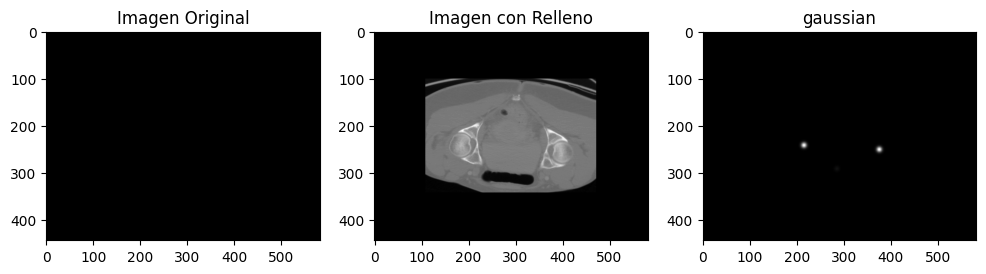

P_2241943_ANTROP.nrrd


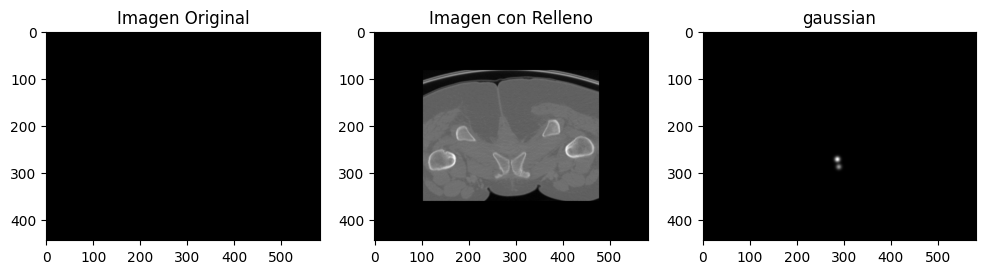

P_840104562_ANTROP.nrrd


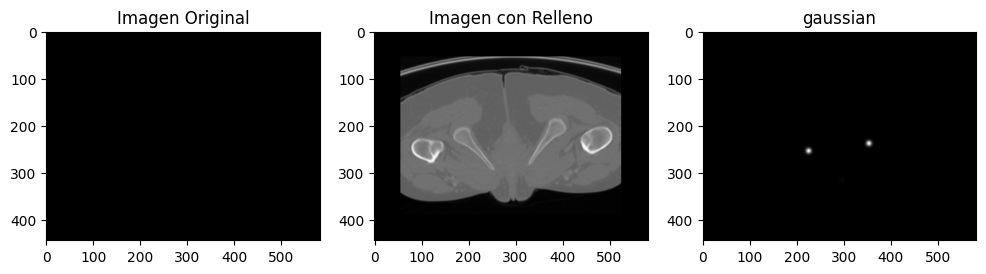

P_2418993_GIN.nrrd


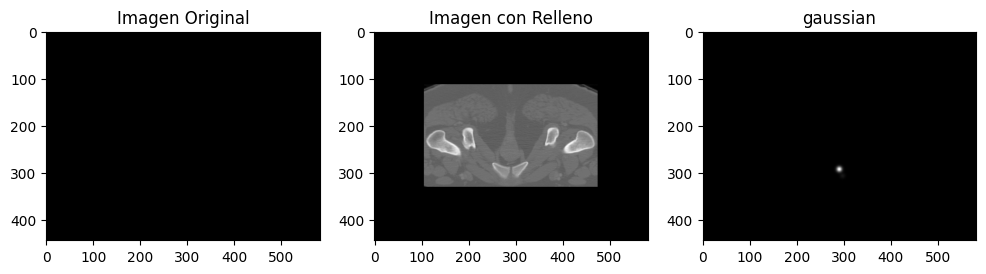

P_840114360_ANTROP.nrrd


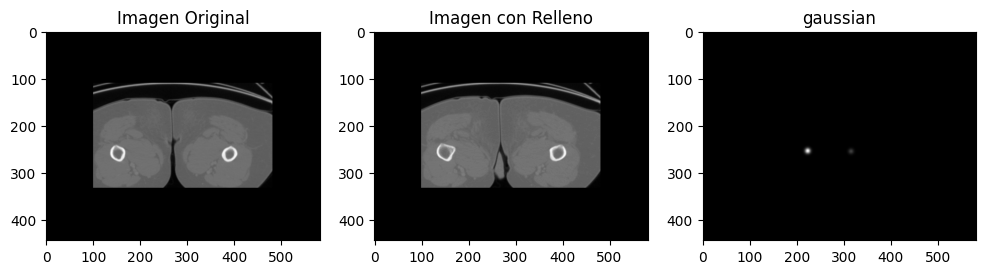

P_802351174_ANTROP.nrrd


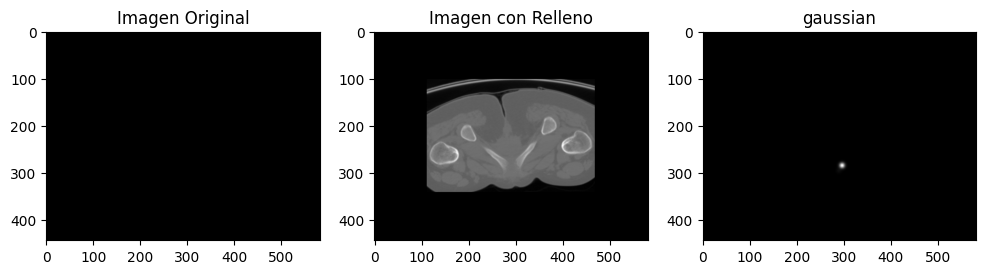

P_2379678_ANTROP.nrrd


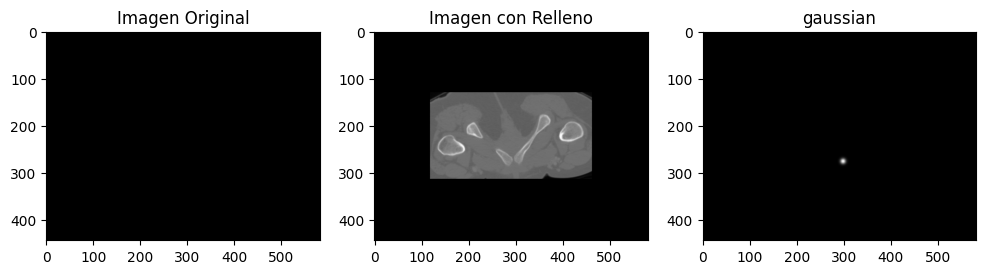

P_10253637_ANTROP.nrrd


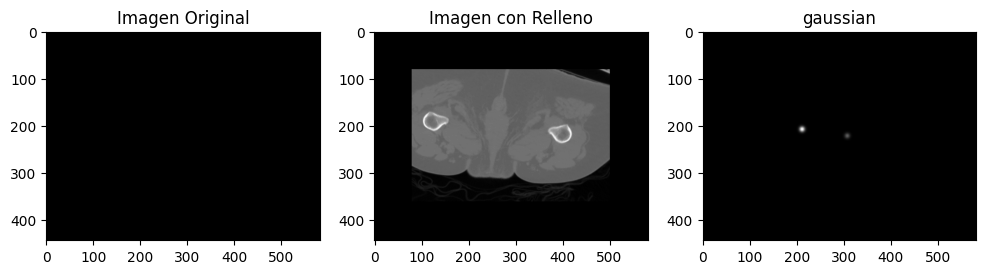

P_10265450_ANTROP.nrrd


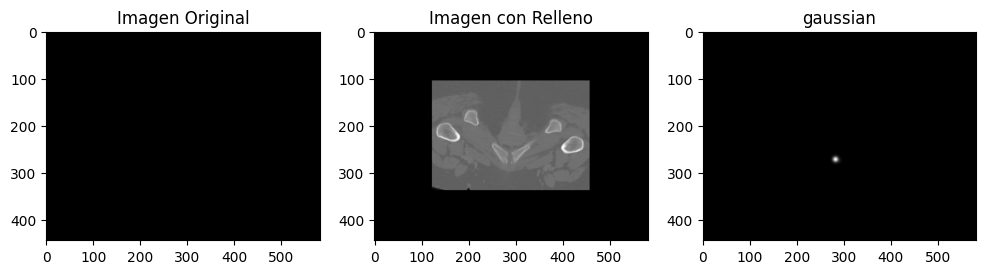

P_1480679_ANTROP.nrrd


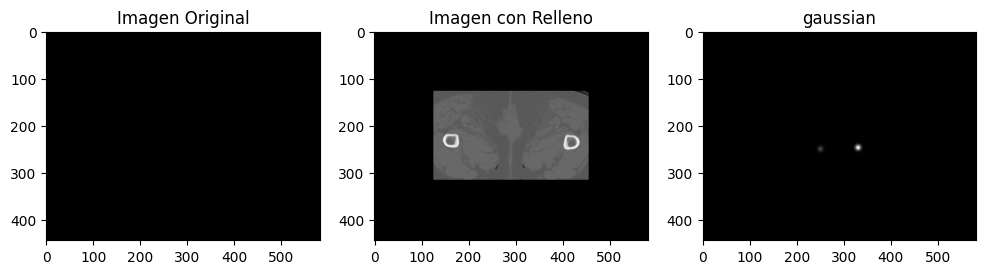

P_2387418_GIN.nrrd


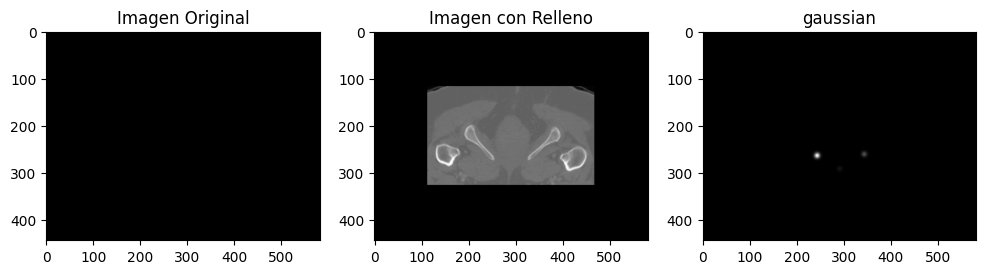

P_10208792_ANDRO.nrrd


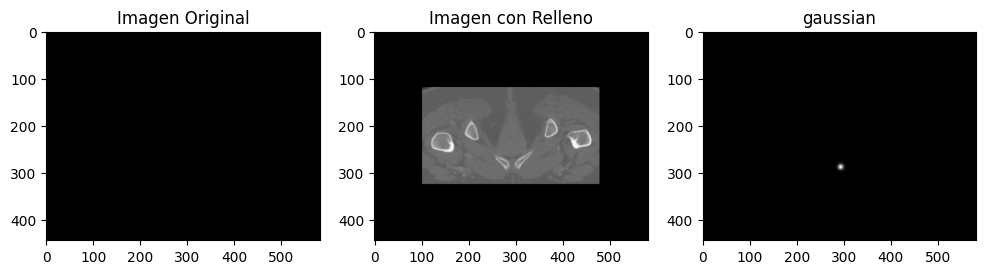

P_10190176_ANTROP.nrrd


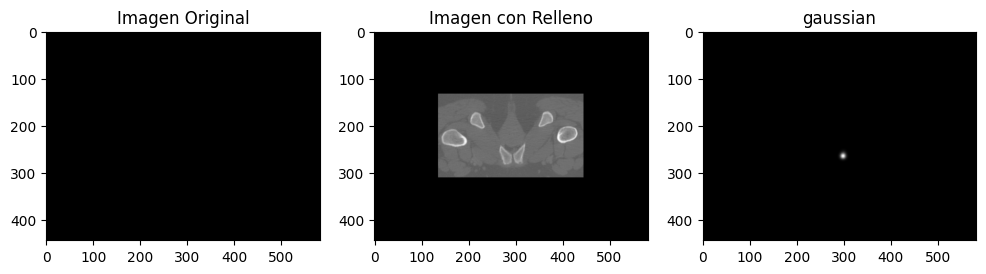

P_2111864_ANTROP.nrrd


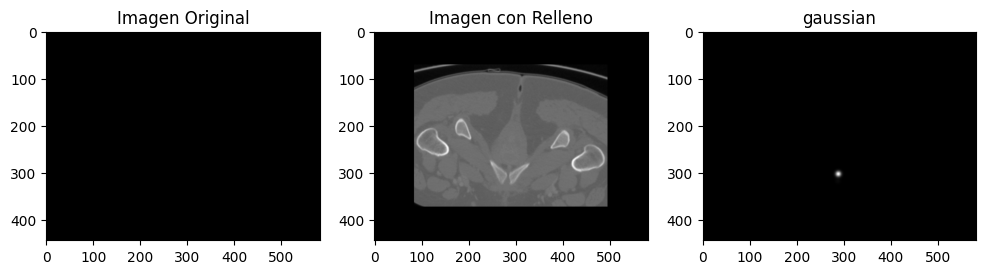

P_1571575_GIN.nrrd


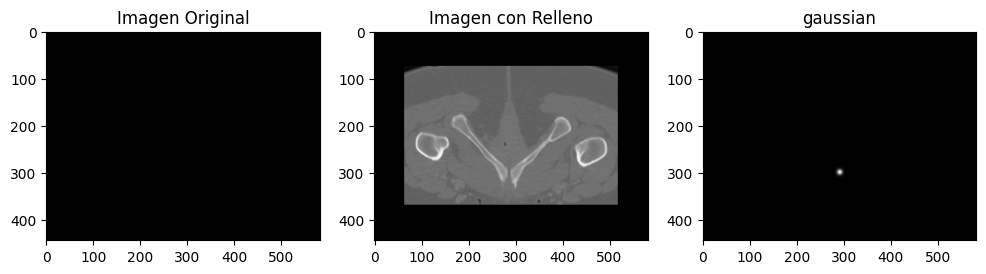

P_10055401_GIN.nrrd


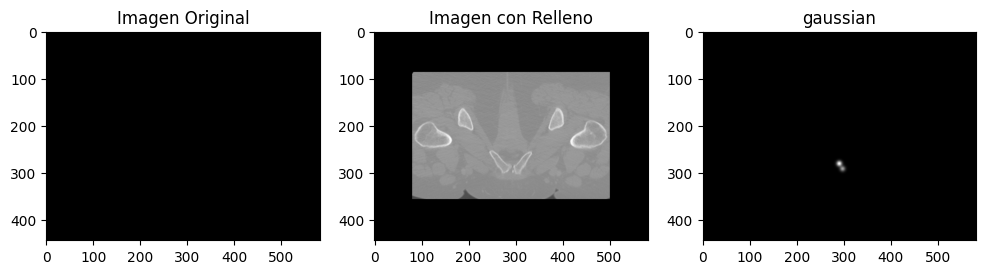

P_1715822_ANTROP.nrrd


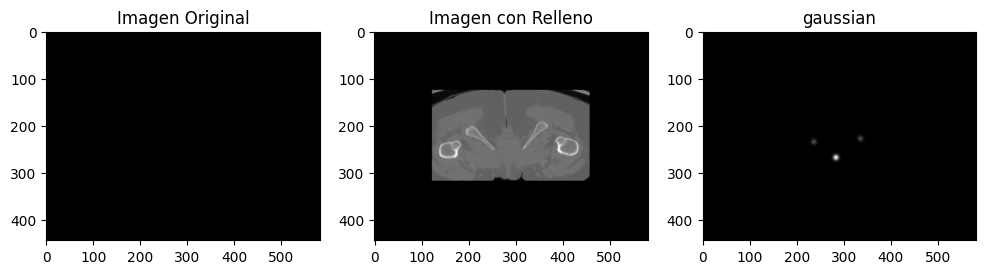

P_840121405_GIN.nrrd


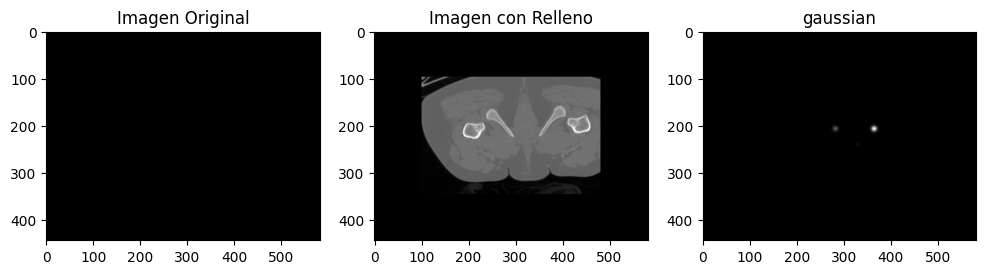

P_1683063_ANTROP.nrrd


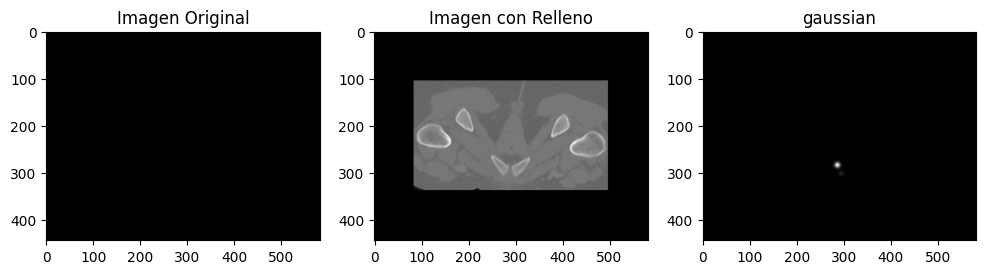

P_1683587_ANTROP.nrrd


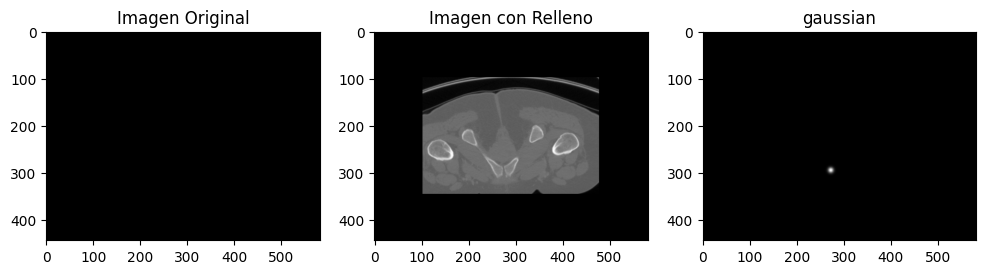

P_2370576_GIN.nrrd


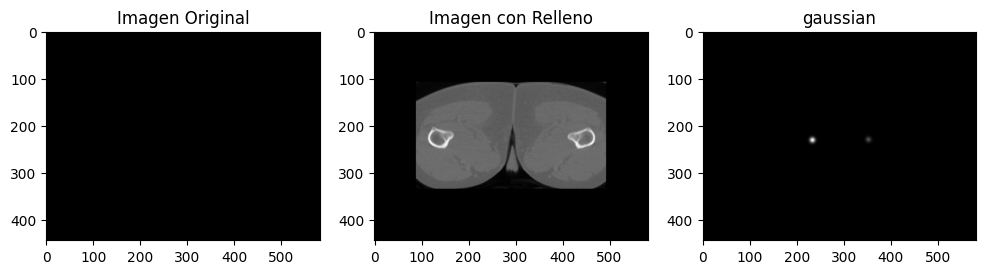

P_840248498_ANTROP.nrrd


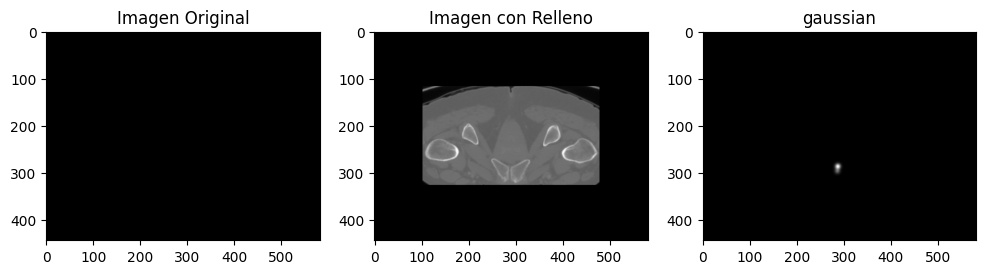

P_10390193_GIN.nrrd


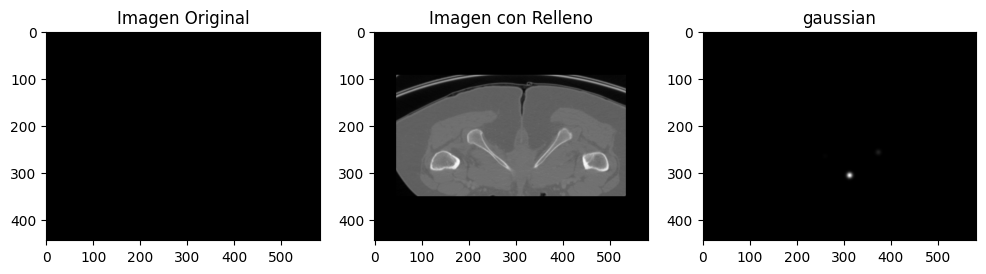

P_1905095_GIN.nrrd


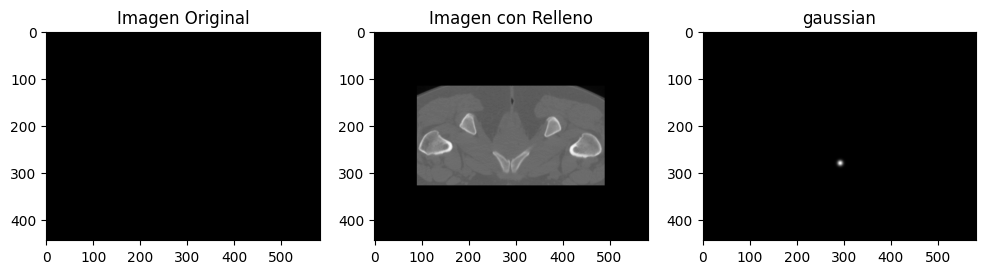

P_2002362_ANTROP.nrrd


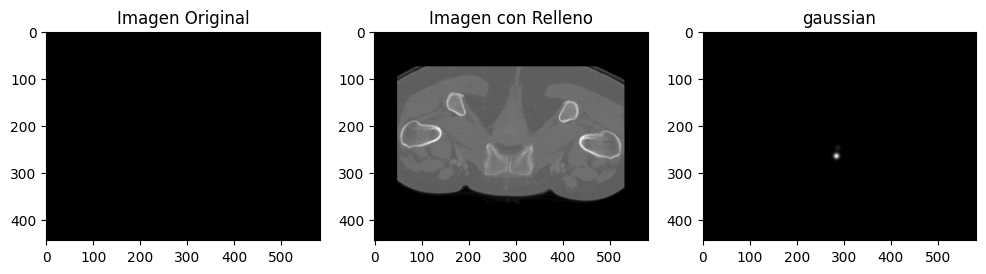

P_1132495_ANTROP.nrrd


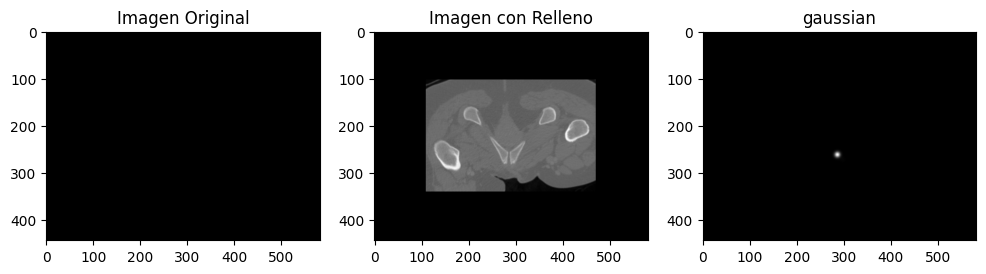

P_1444487_ANTROP.nrrd


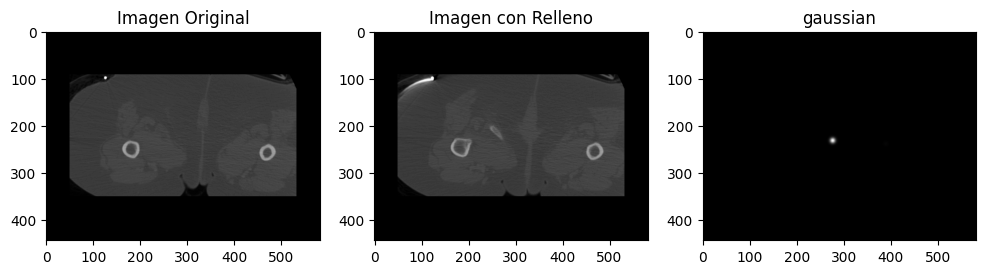

P_1716840_ANTROP.nrrd


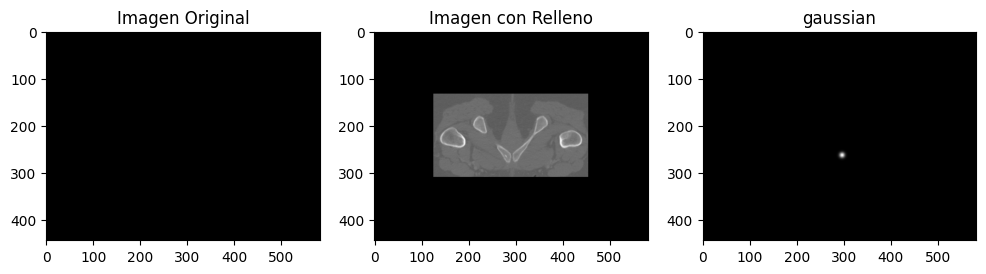

P_1825137_PLATI.nrrd


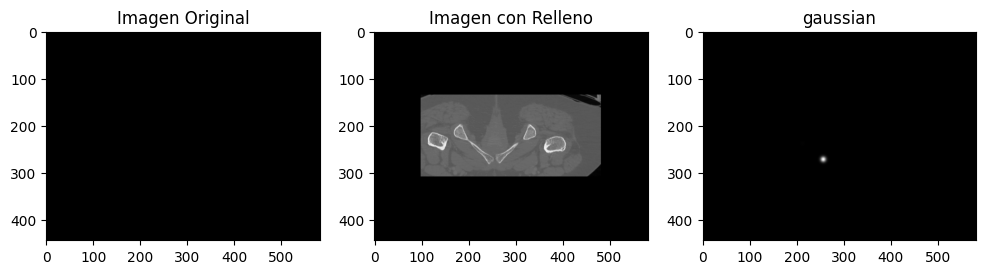

P_2369281_ANTROP.nrrd


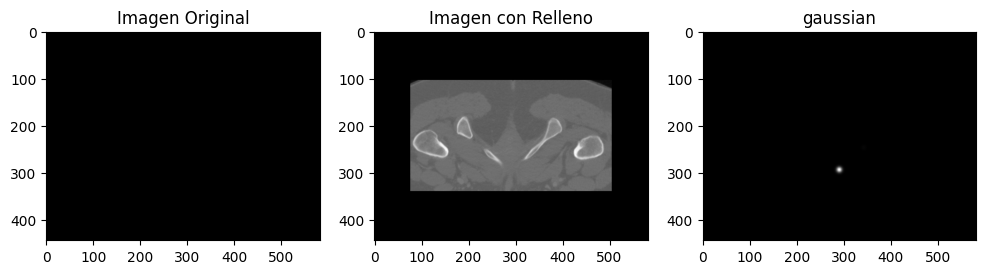

P_2319187_GIN.nrrd


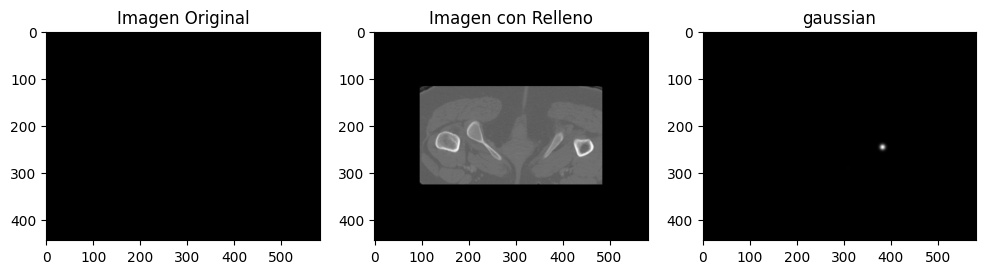

P_1993084_ANTROP.nrrd


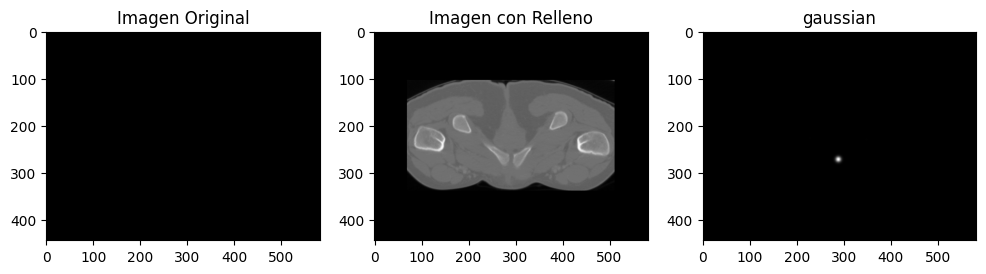

P_1612231_GIN.nrrd


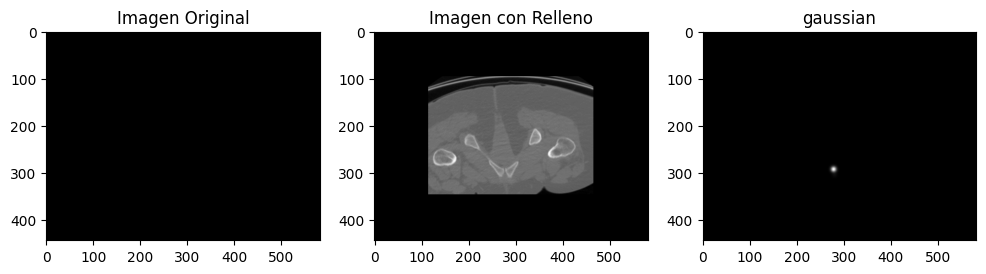

P_2146763_GIN.nrrd


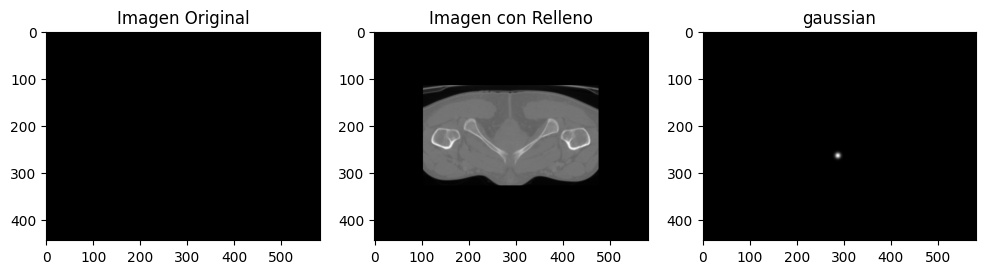

P_2039080_GIN.nrrd


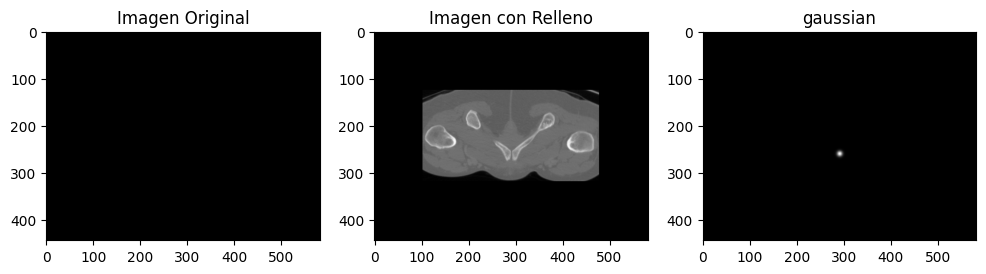

P_10550586_ANTROP.nrrd


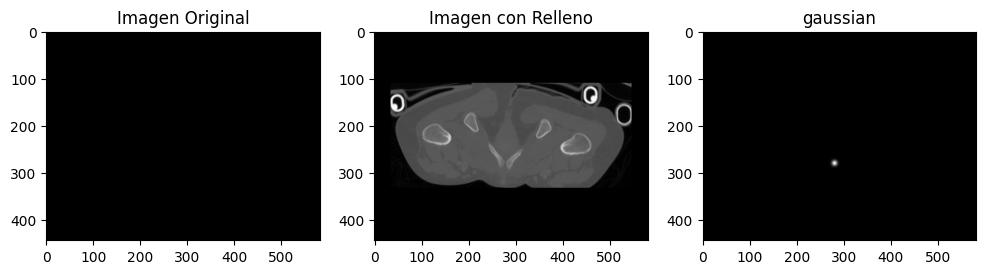

P_1427769_GIN.nrrd


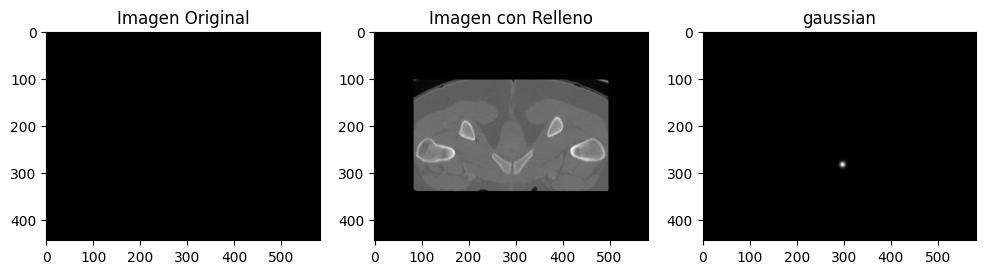

P_10292632_ANTROP.nrrd


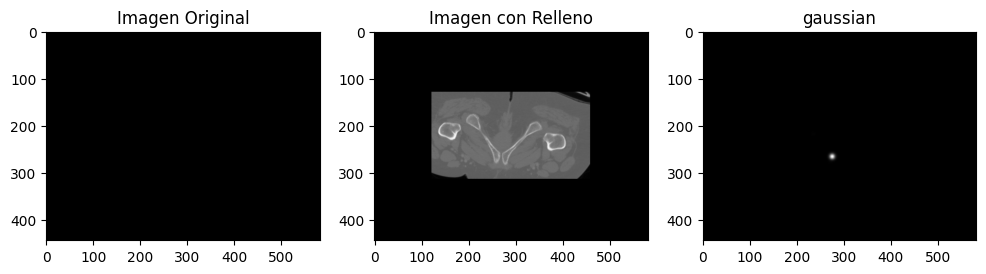

P_2156592_ANTROP.nrrd


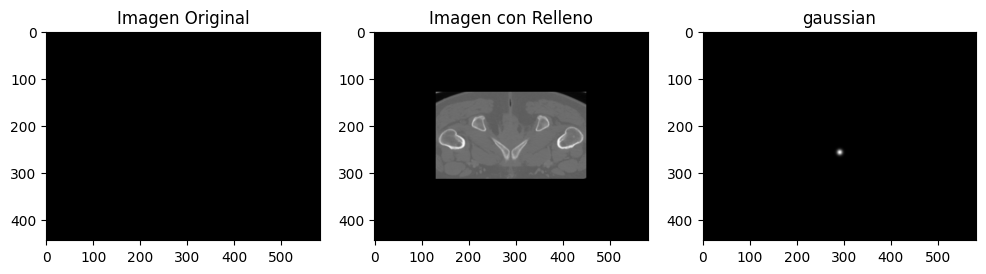

P_10860322_GIN.nrrd


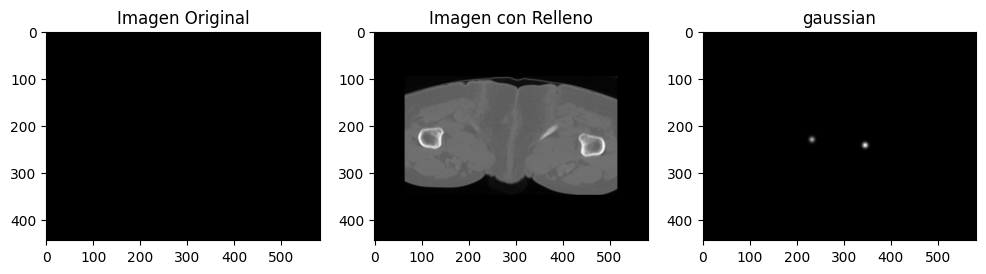

P_2196069_ANTROP.nrrd


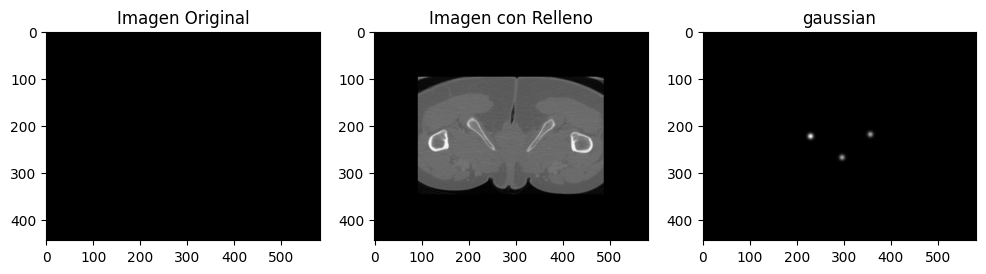

P_1874278_GIN.nrrd


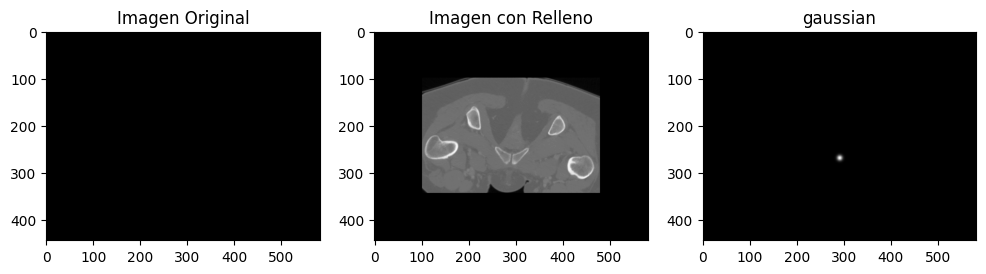

P_840109842_GIN.nrrd


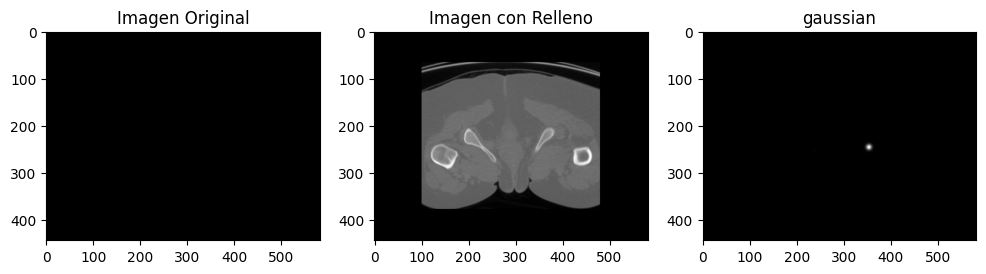

P_808704728_ANTROP.nrrd


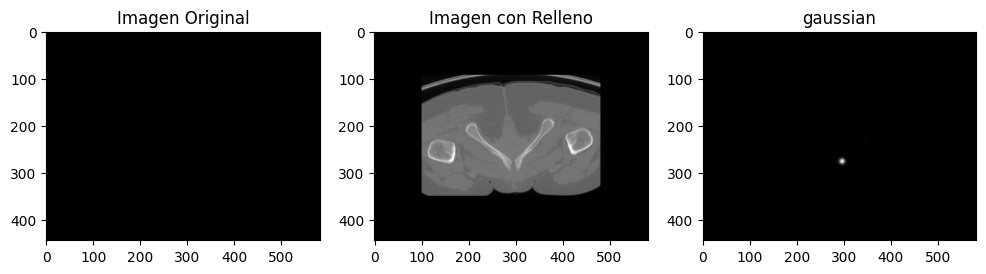

P_10255365_GIN.nrrd


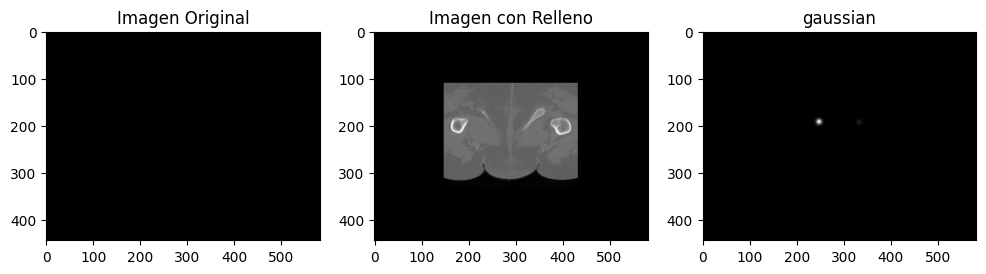

P_10273428_GIN.nrrd


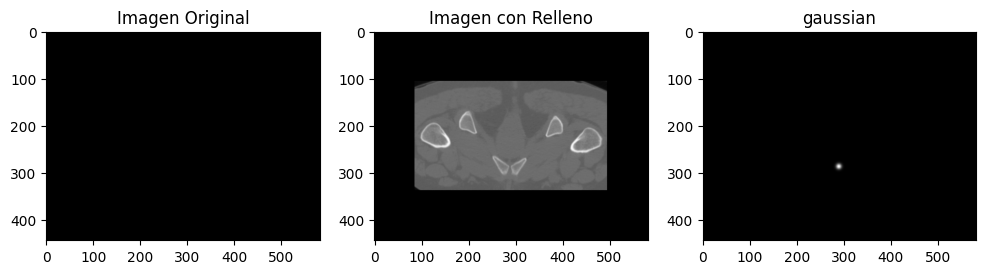

P_1663679_ANTROP.nrrd


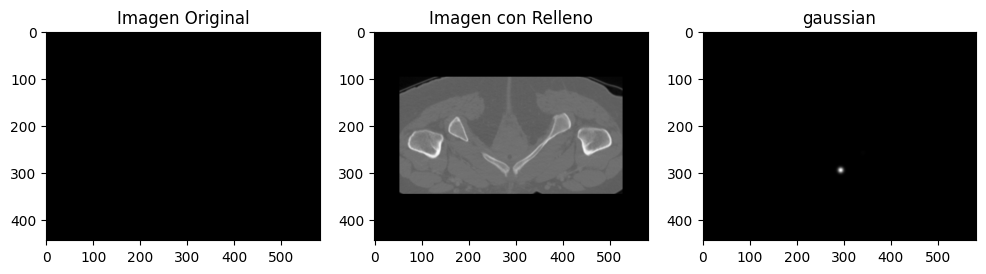

P_2046474_GIN.nrrd
P_1796248_ANTROP.nrrd


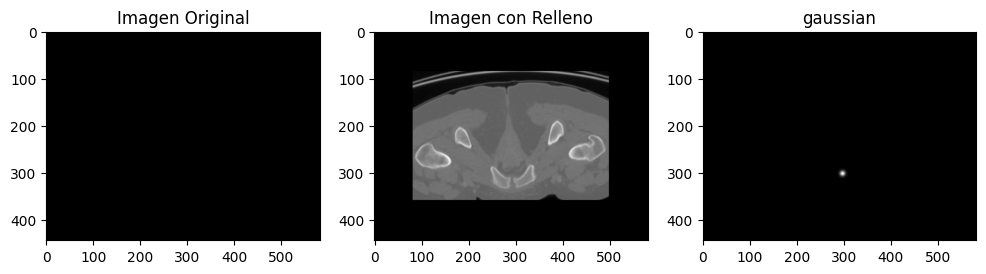

P_10240629_GIN.nrrd


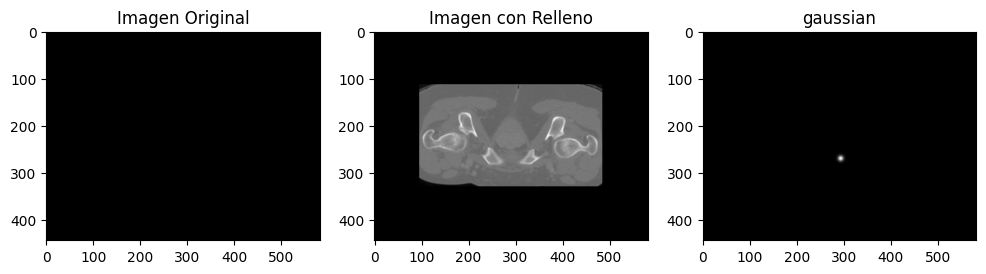

P_840131653_ANDRO.nrrd


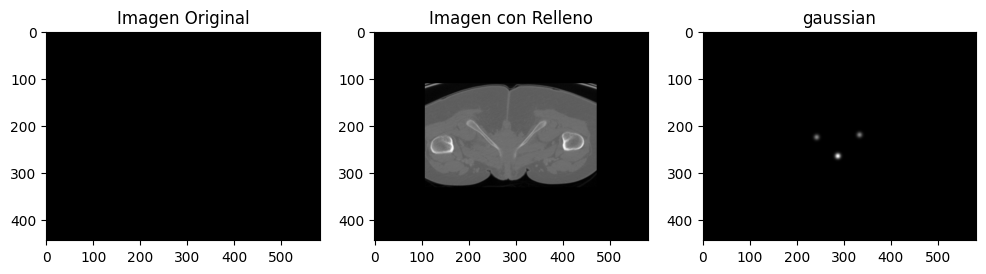

P_2089803_GIN.nrrd


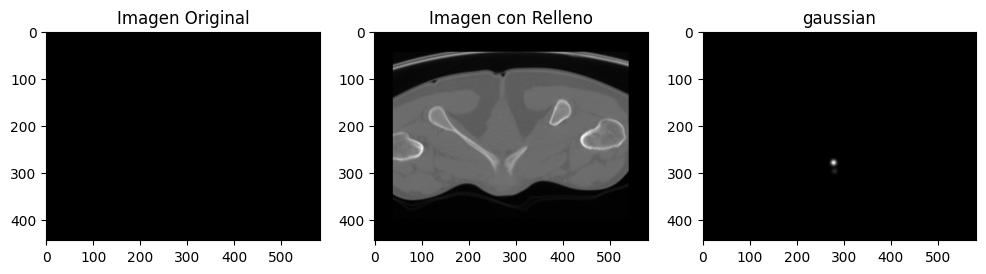

P_2114245_GIN.nrrd


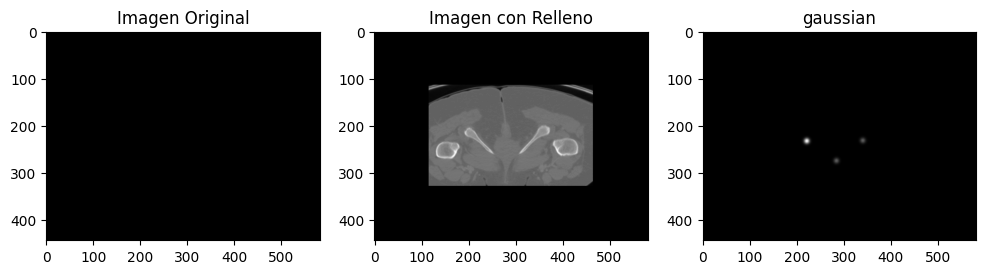

P_808475095_GIN.nrrd


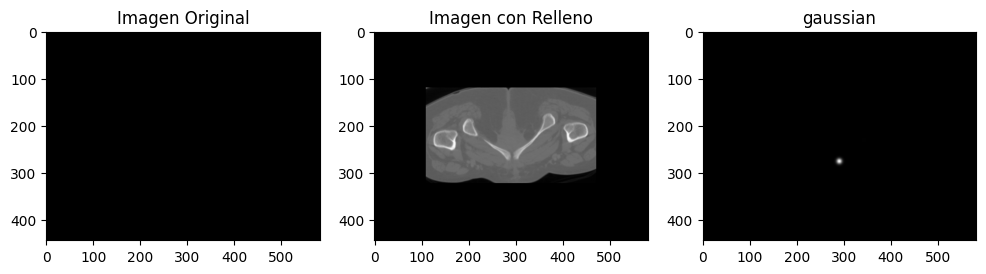

P_2133072_GIN.nrrd


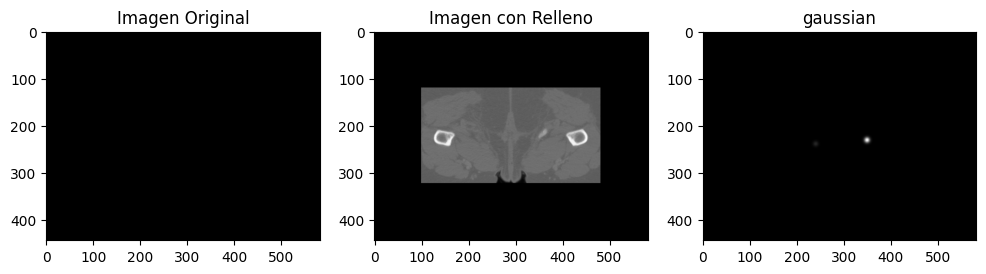

P_10643160_ANTROP.nrrd


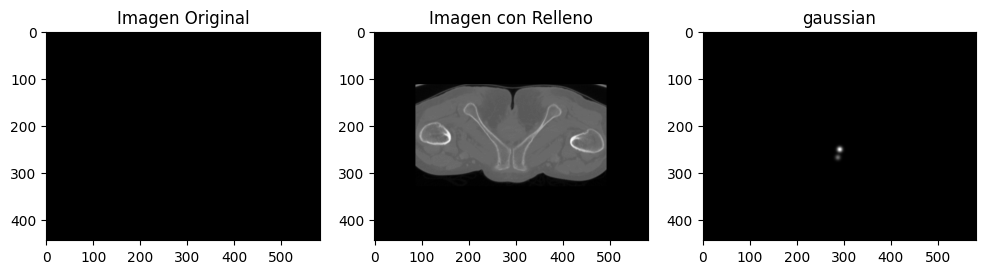

P_80411795_ANDRO.nrrd


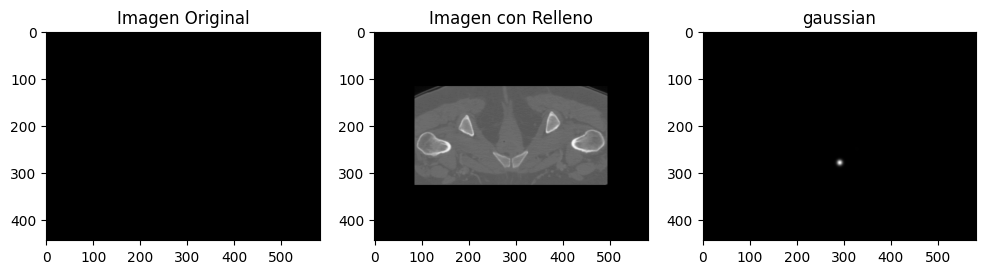

P_840057000_ANTROP.nrrd


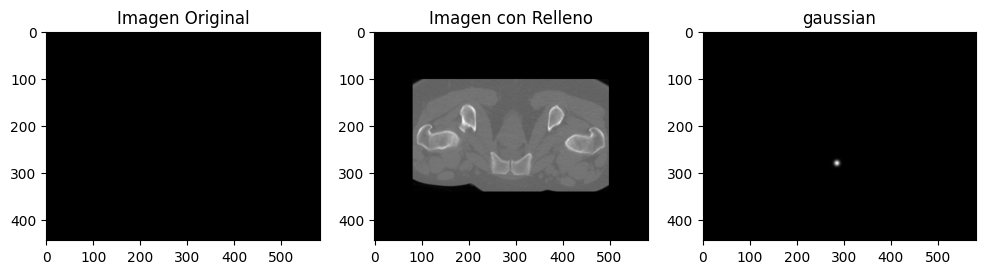

P_1059692_ANTROP.nrrd


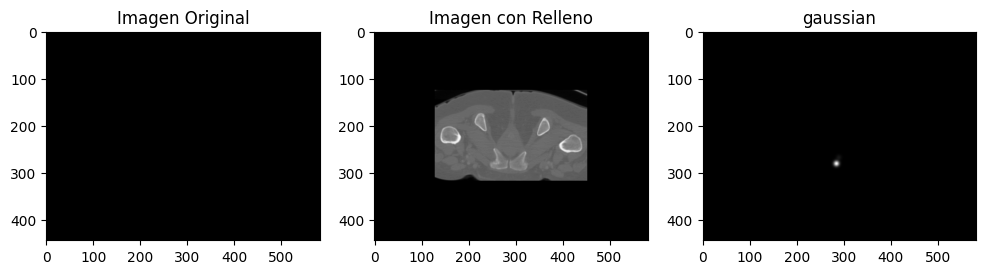

P_10040985_GIN.nrrd


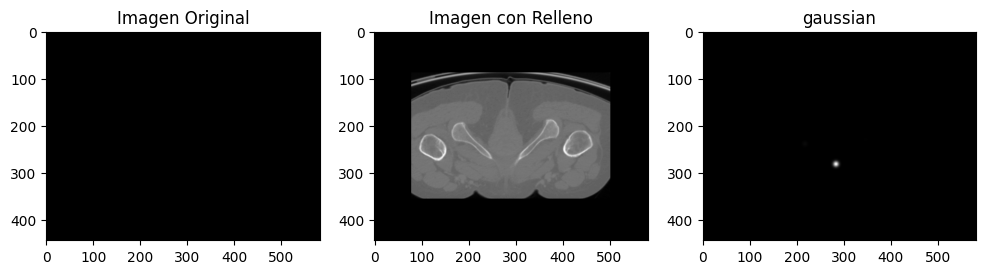

P_2207042_ANTROP.nrrd


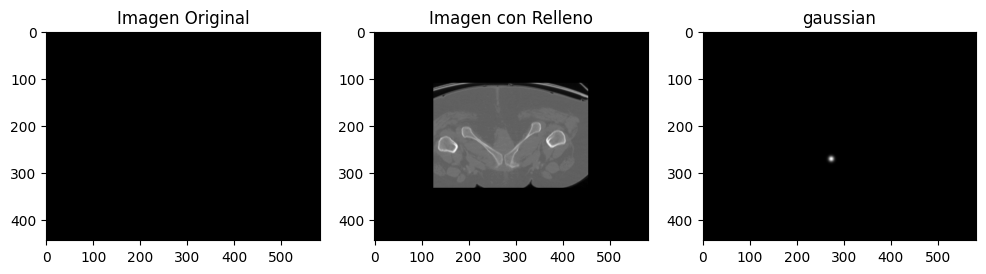

P_808761105_PLATI.nrrd


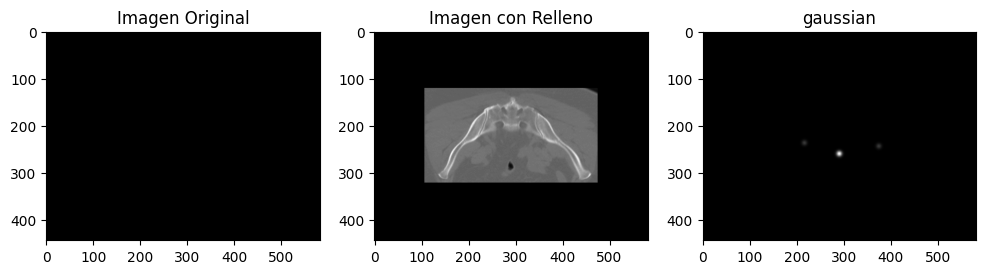

P_2170236-GIN.nrrd


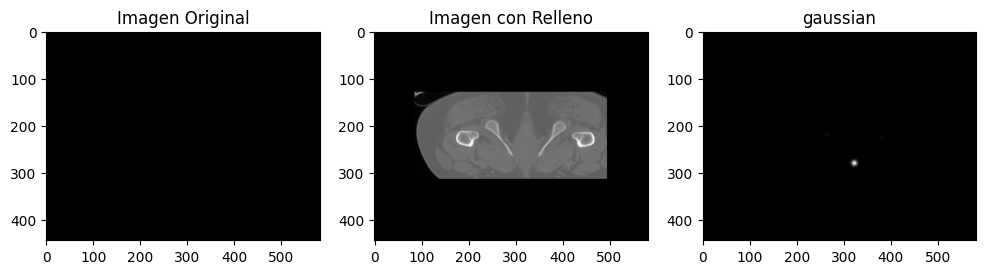

P_10034664_GIN.nrrd


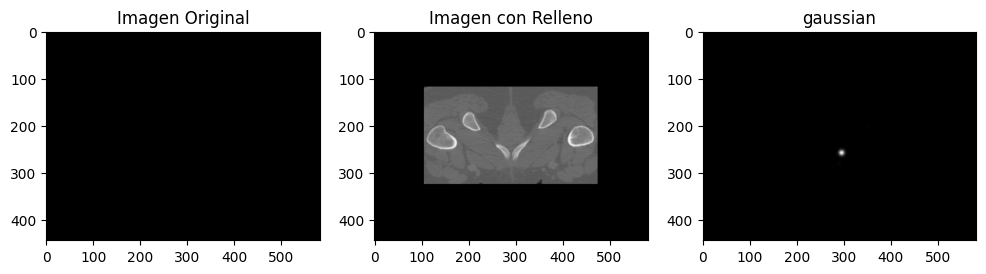

In [3]:
import SimpleITK as sitk
import os
import numpy as np
import matplotlib.pyplot as plt



# def gaussian_3d(shape, center, sigma = 10):
#     x = np.arange(0, shape[0], 1, float)
#     y = np.arange(0, shape[1], 1, float)
#     z = np.arange(0, shape[2], 1, float)
    

#     x, y, z = np.meshgrid(x, y, z)
    
#     gaussian = np.exp(-((x - center[0])**2 + (y - center[1])**2 + (z - center[2])**2) / (2 * sigma**2))

#     return gaussian / np.max(gaussian)


def pad_images(image_folder, output_folder,landmarks_folder,save_landmarks_folder,gaussians_save):
    # Obtener el tamaño máximo necesario para el relleno
    # max_size = get_maximum_size(image_folder)
    max_size = [582,444,315]
    
    GAUSSIAN_IMAGES =[]
    PADDED_IMAGES = []
    # Asegurarse de que la carpeta de salida exista
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    if not os.path.exists(save_landmarks_folder):
        os.makedirs(save_landmarks_folder)
    if not os.path.exists(gaussians_save):
        os.makedirs(gaussians_save) 
    # Iterar sobre las imágenes y aplicar el relleno
    for image_file in os.listdir(image_folder):
        print(image_file)
        image_path = os.path.join(image_folder, image_file)
        
        gaussian_path = os.path.join(gaussians_save, image_file)
        landmarks_filename = f"{os.path.splitext(image_file)[0]}_landmarks.txt"
        landmarks_path = os.path.join(landmarks_folder, landmarks_filename)
        
        if (image_file != "padded" and image_file!="padded_landmarks" and image_file!="padded_gaussians"): 
            landmarks = np.loadtxt(landmarks_path)
            # print(landmarks[0])
            # Leer la imagen con SimpleITK
            image = sitk.ReadImage(image_path,sitk.sitkFloat32)
            # normalize image
            image_array = sitk.GetArrayFromImage(image)
            
            image_array_normalized = (image_array - image_array.min()) / (image_array.max()- image_array.min())
            image = sitk.GetImageFromArray(image_array_normalized)
            gaussian = sitk.ReadImage(gaussian_path, sitk.sitkFloat32)
            # Obtener el tamaño actual de la imagen
            current_size = np.array(image.GetSize())
            try:
                # Calcular la cantidad de relleno necesario
                padding_size = max_size - current_size
                
                # Aplicar el relleno
                # padding_size = np.maximum(padding_size - current_size, 0)
                
                # Compute the amount of padding needed for each dimension
                pad_x = int(padding_size[0])
                pad_y = int(padding_size[1])
                pad_z = int(padding_size[2])

                # Define the amount of padding for each side of the image
                lower_pad = (pad_x//2, pad_y//2, pad_z//2)
                upper_pad = (pad_x - lower_pad[0], pad_y - lower_pad[1], pad_z - lower_pad[2])
                
                # Create the filter for zero-padding the image
                padding_filter = sitk.ConstantPadImageFilter()

                # Set the padding value to 0
                padding_value = 0

                # Apply the padding filter to the input image
                padded_image = sitk.ConstantPad(image, lower_pad, upper_pad, padding_value)
                padded_image.SetOrigin(image.GetOrigin())
                
                padded_gaussian = sitk.ConstantPad(gaussian, lower_pad, upper_pad, padding_value)
                padded_gaussian.SetOrigin(gaussian.GetOrigin())
                
                gaussian_image = padded_gaussian
                
                # Guardar la imagen con relleno en la carpeta de salida
                output_path = os.path.join(output_folder, image_file)
                # sitk.WriteImage(padded_image, output_path)
                PADDED_IMAGES.append(padded_image)
                GAUSSIAN_IMAGES.append(gaussian_image)
                
                
                
            # RESIZE 
                image = padded_image
                gaussian = gaussian_image
                
                input_size = image.GetSize()
                gaussian_size = gaussian.GetSize()

                # Define the new size of the image with reduced number of slices
                new_size = [input_size[0]//3, input_size[1]//3, input_size[2]//3] 
                new_gauss_size = [gaussian_size[0]//3, gaussian_size[1]//3, gaussian_size[2]//3] 
                
                original_spacing = image.GetSpacing()
                original_gauss_spacing = gaussian.GetSpacing()
                
                new_spacing = [image.GetSpacing()[0]*3, image.GetSpacing()[1]*3, image.GetSpacing()[2]*3] # change "*2" to the inverse of the reduction factor
                new_gauss_spacing = [gaussian.GetSpacing()[0]*3, gaussian.GetSpacing()[1]*3, gaussian.GetSpacing()[2]*3]
                
                final_transformed_resampled = sitk.Resample(image, new_size, sitk.Transform(), sitk.sitkLinear, image.GetOrigin(), new_spacing, image.GetDirection(), 0.0, image.GetPixelID())
                final_gaussian_resampled = sitk.Resample(gaussian, new_gauss_size, sitk.Transform(), sitk.sitkLinear, gaussian.GetOrigin(), new_gauss_spacing, gaussian.GetDirection(), 0.0, gaussian.GetPixelID())
            ## SAVE
                sitk.WriteImage(final_transformed_resampled, output_path)
                sitk.WriteImage((final_gaussian_resampled), gaussians_save +image_file )
                
                
                # origin = np.array(image.GetOrigin())
                # spacing = np.array(image.GetSpacing())    
                
                # direction_matrix = np.array(image.GetDirection()).reshape((3,3))
            
                # coordinates = []
                # padded_coordinates = []
                
                # # Crear una imagen para mostrar las gaussianas
                # gaussian_image = np.zeros(padded_image.GetSize())

                
                # for landmark in landmarks:
                #     # print(landmark)
                #     coordinate = np.round(np.linalg.inv(direction_matrix).dot(landmark - origin) / spacing).astype(int)
                #     coordinate = abs(coordinate) 
                #     coordinates.append(coordinate.tolist())
                #     # Obtener la nueva posición de los landmarks después del relleno
                #     landmarks_after_padding = coordinate + np.array(lower_pad)
                #     padded_coordinates.append(landmarks_after_padding.tolist())

                    
                #     gaussian = gaussian_3d(padded_image.GetSize(), landmarks_after_padding.tolist())
                #     gaussian = np.transpose(gaussian, (1,0,2))
                #     # print(gaussian.shape)
                #     # print(gaussian_image.shape)
                #     gaussian_image += gaussian
                # #     print(gaussian_image.shape)
                # #     # print('max',gaussian_image.max())
                # gaussian_image = np.transpose(gaussian_image, (2,1,0))
                # sitk.WriteImage(sitk.GetImageFromArray(gaussian_image), gaussians_save +image_file )
                
                # np.savetxt(save_landmarks_folder + landmarks_filename, padded_coordinates)
            
                # Visualizar la imagen original y la imagen con relleno
                plt.figure(figsize=(12, 6))
                
                plt.subplot(1, 3, 1)
                # plt.scatter(coordinate[0], coordinate[1], s=15, c='red', marker='o')
                # plt.imshow(sitk.GetArrayFromImage(image)[int(coordinate[2]), :, :], cmap='gray')
                
                plt.imshow(sitk.GetArrayFromImage(image)[22, :, :], cmap='gray')
                plt.title('Imagen Original')
                
                # Imagen con relleno
                plt.subplot(1, 3, 2)
                # plt.scatter(landmarks_after_padding[0], landmarks_after_padding[1], s=15, c='red', marker='o')
                # plt.imshow(sitk.GetArrayFromImage(padded_image)[int(coordinate[2])+lower_pad[2], :,:], cmap='gray')
                
                plt.imshow(sitk.GetArrayFromImage(padded_image)[22+lower_pad[2], :,:], cmap='gray')
                plt.title('Imagen con Relleno')
                
                # Gaussiana
                plt.subplot(1, 3, 3)
                # plt.scatter(landmarks_after_padding[0], landmarks_after_padding[1], s=15, c='red', marker='o')
                # plt.imshow(gaussian_image[int(coordinate[2])+lower_pad[2], :,:], cmap='gray')
                plt.imshow(sitk.GetArrayFromImage(gaussian_image)[22+lower_pad[2], :,:], cmap='gray')
                plt.title('gaussian')

                plt.show()
                
                
            except:
                pass
    return PADDED_IMAGES, GAUSSIAN_IMAGES
            
# Uso de la función
image_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/Cropped_images/"
output_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded/"
landmarks_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_landmarks/"
save_landmarks_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_landmarks/"
gaussians_save = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_gaussians/"

PADDED_IMAGES, GAUSSIAN_IMAGES = pad_images(image_folder, output_folder,landmarks_folder,save_landmarks_folder,gaussians_save)

# Resize

In [6]:
def gaussian_3d(shape, center, sigma = 4):
    x = np.arange(0, shape[0], 1, float)
    y = np.arange(0, shape[1], 1, float)
    z = np.arange(0, shape[2], 1, float)
    

    x, y, z = np.meshgrid(x, y, z)
    
    gaussian = np.exp(-((x - center[0])**2 + (y - center[1])**2 + (z - center[2])**2) / (2 * sigma**2))

    return gaussian / np.max(gaussian)

In [4]:
# im_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/Cropped_images/"
im_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_gaussians/"
im_list = os.listdir(im_path)

for i in range(len(im_list)):
    image_file = im_list[i]
    if (image_file != "padded" and image_file!="padded_landmarks" and image_file!="padded_gaussians"):  
            
        image = sitk.ReadImage(im_path + im_list[i], sitk.sitkFloat32)
        print(image.GetSize())

(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(378, 205, 452)
(194, 148, 105)
(194, 148, 105)
(194, 148, 105)
(194, 14

In [11]:
print(len(PADDED_IMAGES))

74


FINAL_SIZES (194, 148, 157) (194, 148, 157)


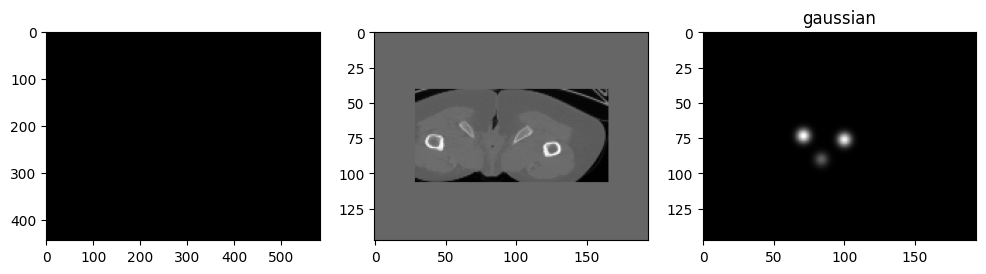

FINAL_SIZES (194, 148, 157) (194, 148, 157)


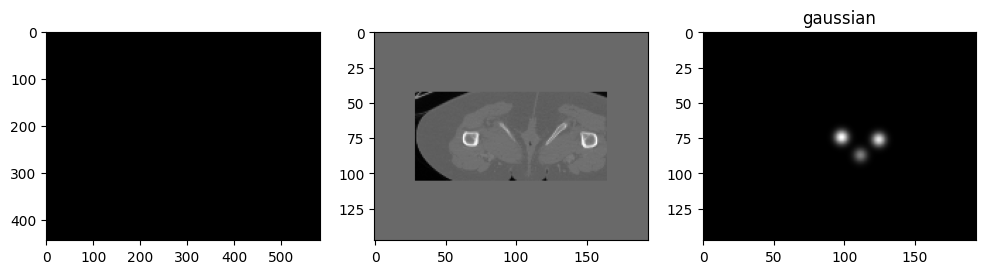

FINAL_SIZES (194, 148, 157) (194, 148, 157)


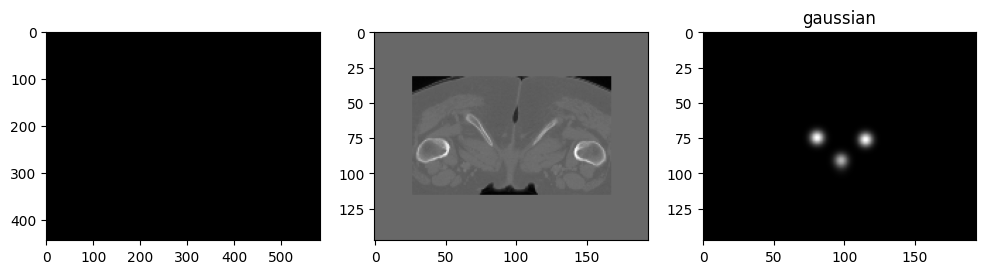

FINAL_SIZES (194, 148, 157) (194, 148, 157)


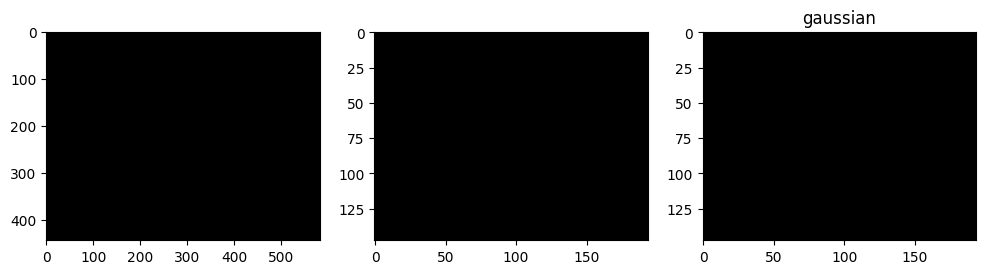

FINAL_SIZES (194, 148, 157) (194, 148, 157)


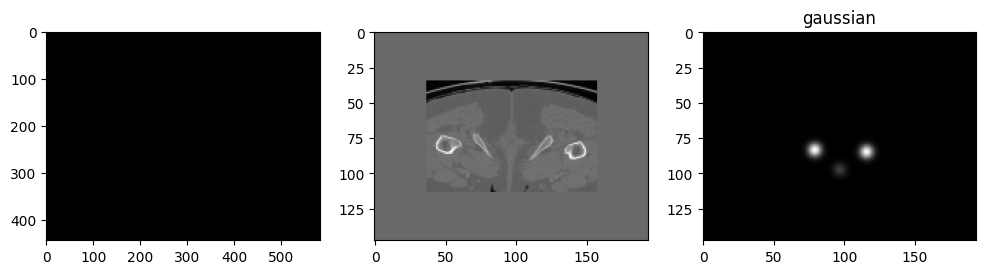

FINAL_SIZES (194, 148, 157) (194, 148, 157)


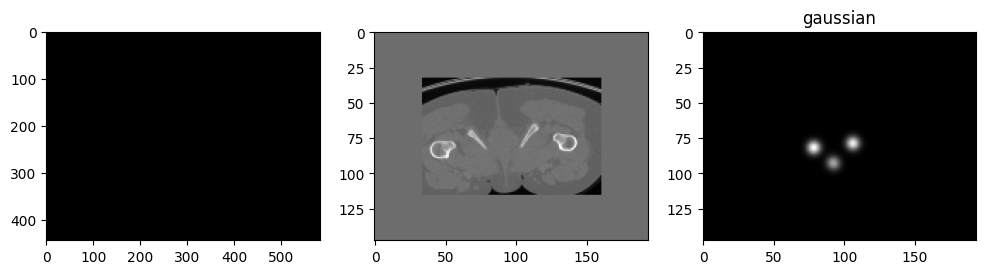

FINAL_SIZES (194, 148, 157) (194, 148, 157)


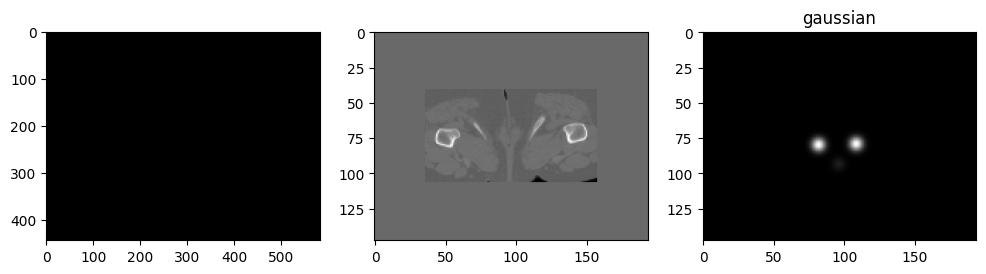

FINAL_SIZES (194, 148, 157) (194, 148, 157)


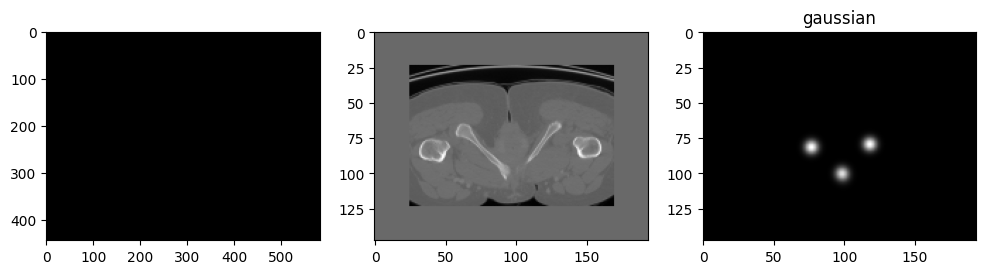

FINAL_SIZES (194, 148, 157) (194, 148, 157)


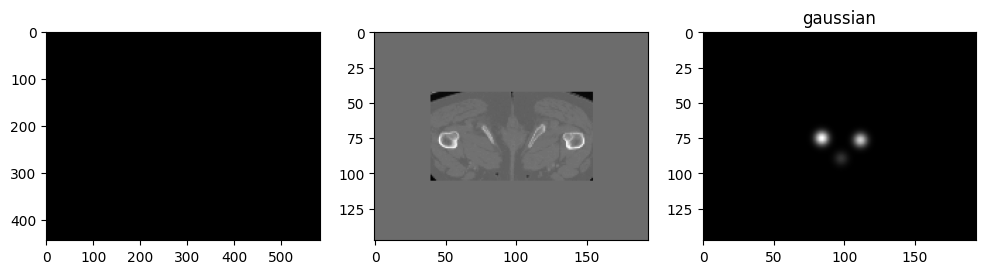

FINAL_SIZES (194, 148, 157) (194, 148, 157)


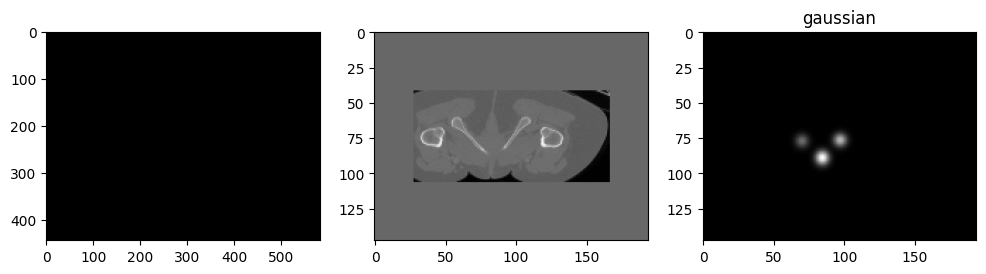

FINAL_SIZES (194, 148, 157) (194, 148, 157)


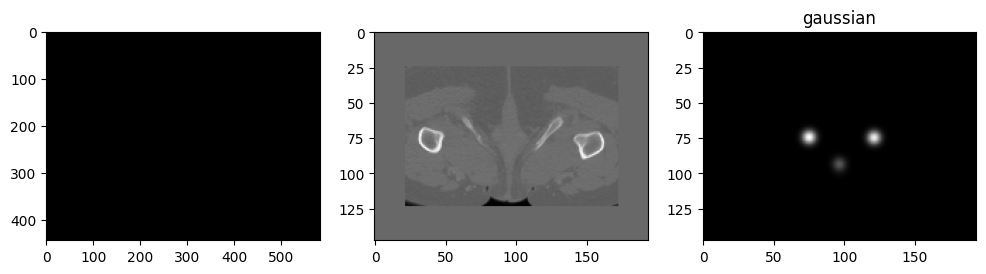

FINAL_SIZES (194, 148, 157) (194, 148, 157)


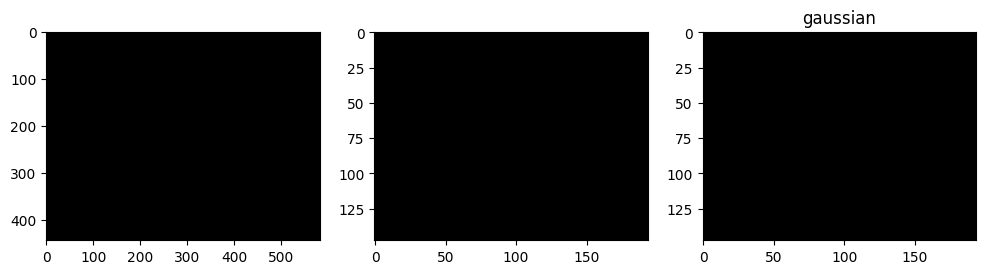

FINAL_SIZES (194, 148, 157) (194, 148, 157)


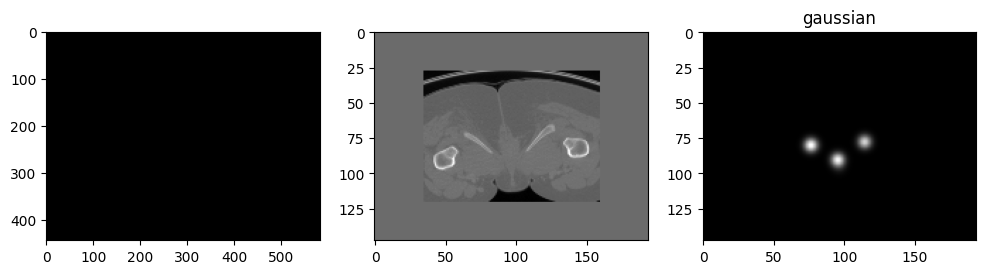

FINAL_SIZES (194, 148, 157) (194, 148, 157)


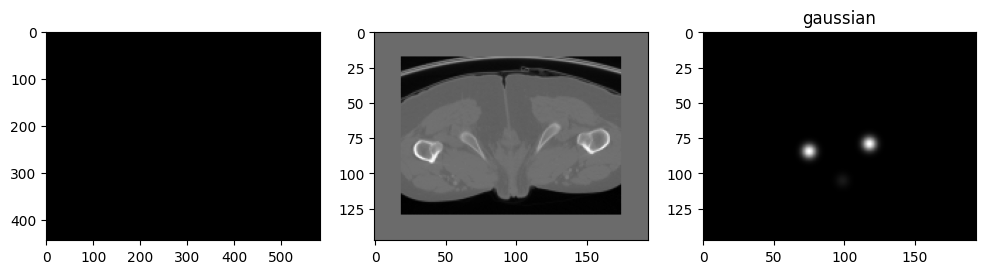

FINAL_SIZES (194, 148, 157) (194, 148, 157)


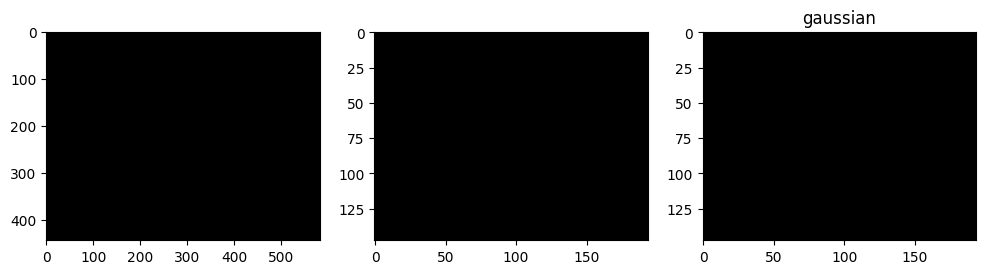

FINAL_SIZES (194, 148, 157) (194, 148, 157)


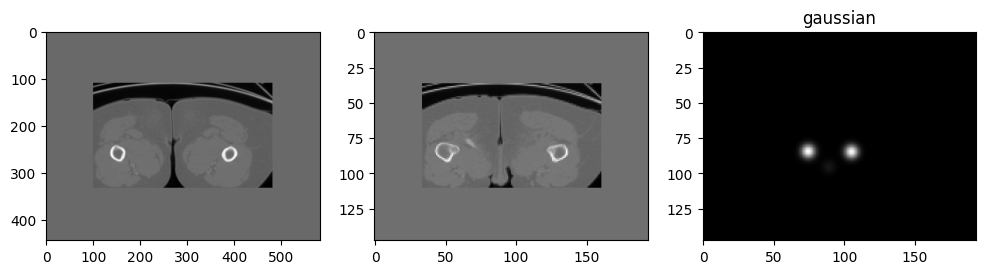

FINAL_SIZES (194, 148, 157) (194, 148, 157)


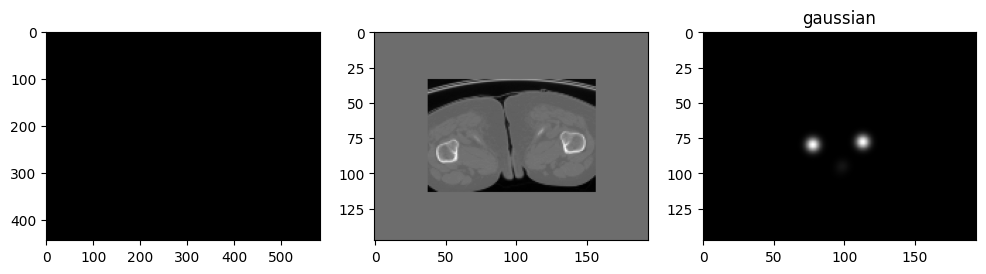

FINAL_SIZES (194, 148, 157) (194, 148, 157)


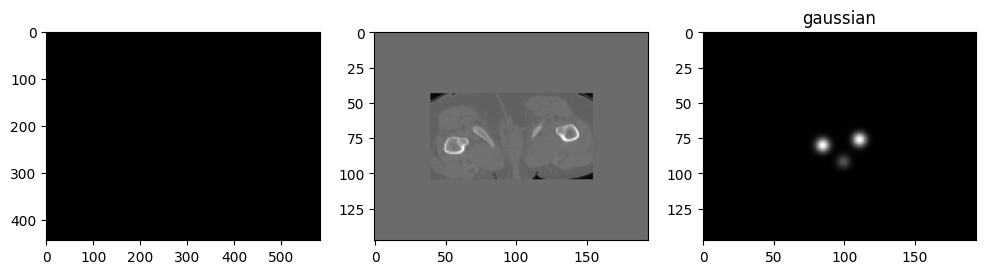

FINAL_SIZES (194, 148, 157) (194, 148, 157)


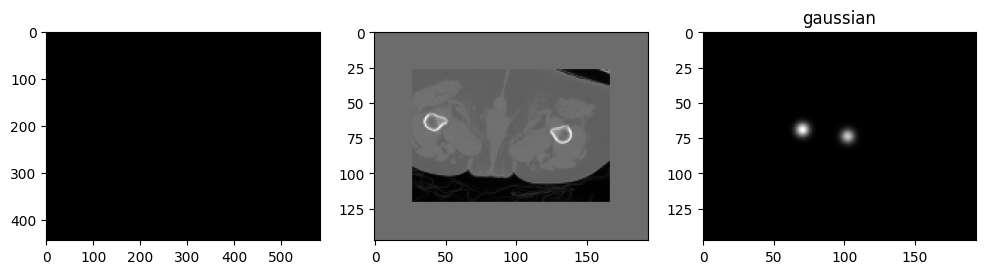

FINAL_SIZES (194, 148, 157) (194, 148, 157)


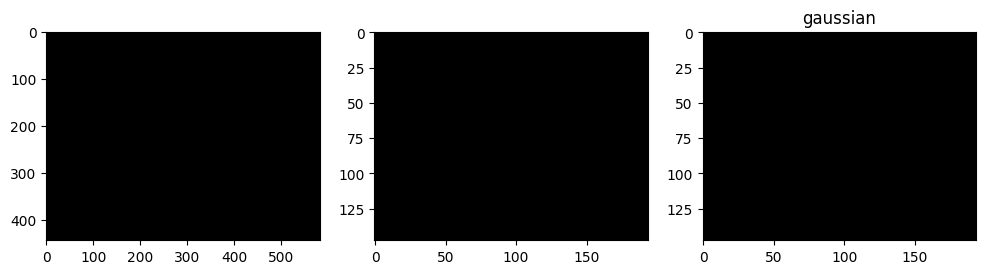

FINAL_SIZES (194, 148, 157) (194, 148, 157)


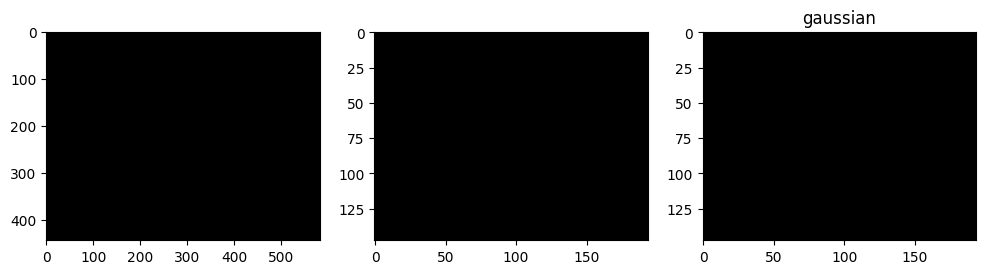

FINAL_SIZES (194, 148, 157) (194, 148, 157)


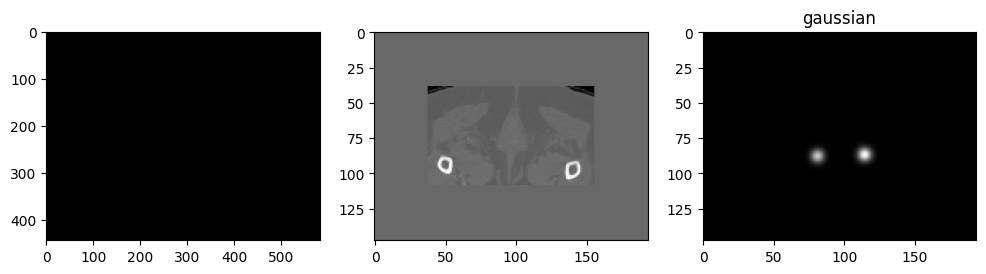

FINAL_SIZES (194, 148, 157) (194, 148, 157)


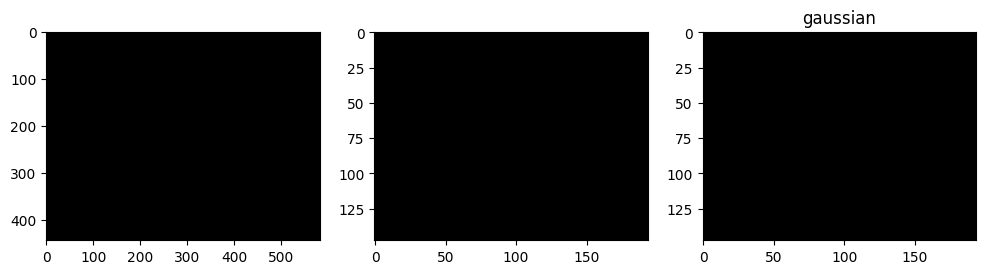

FINAL_SIZES (194, 148, 157) (194, 148, 157)


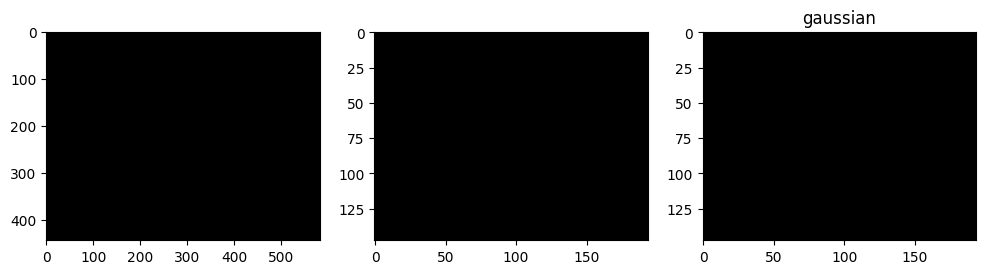

FINAL_SIZES (194, 148, 157) (194, 148, 157)


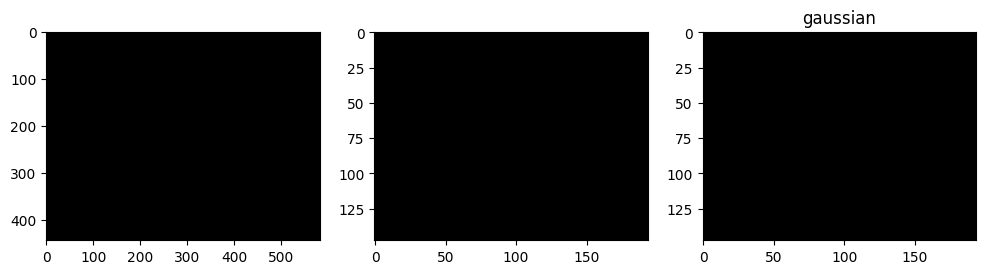

FINAL_SIZES (194, 148, 157) (194, 148, 157)


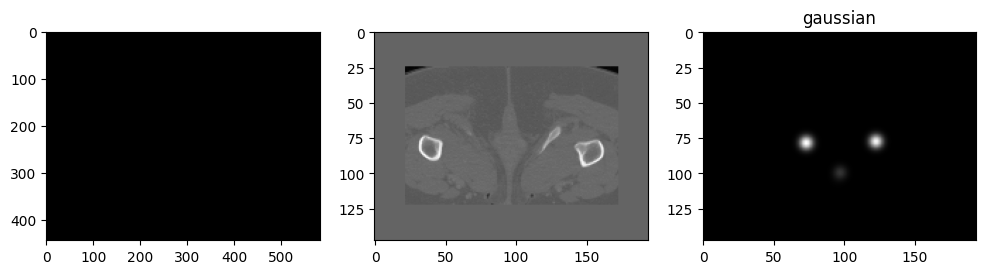

FINAL_SIZES (194, 148, 157) (194, 148, 157)


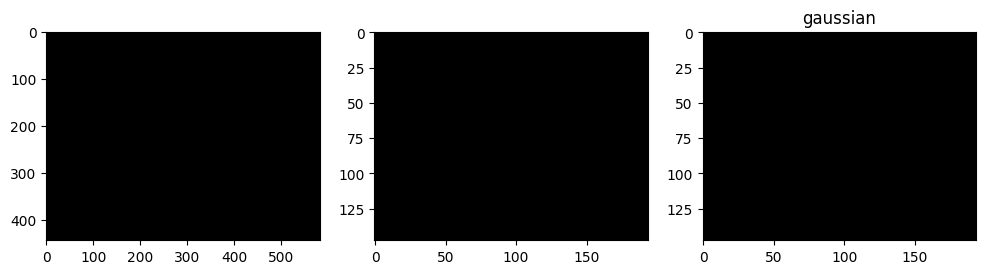

FINAL_SIZES (194, 148, 157) (194, 148, 157)


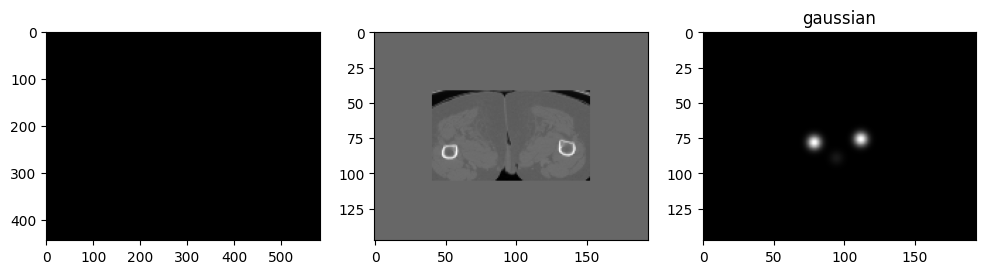

FINAL_SIZES (194, 148, 157) (194, 148, 157)


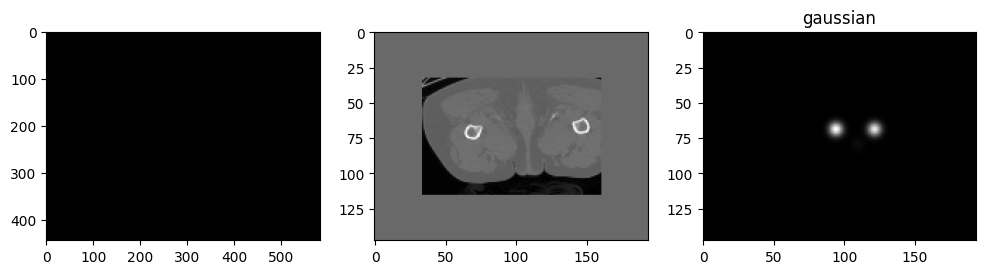

FINAL_SIZES (194, 148, 157) (194, 148, 157)


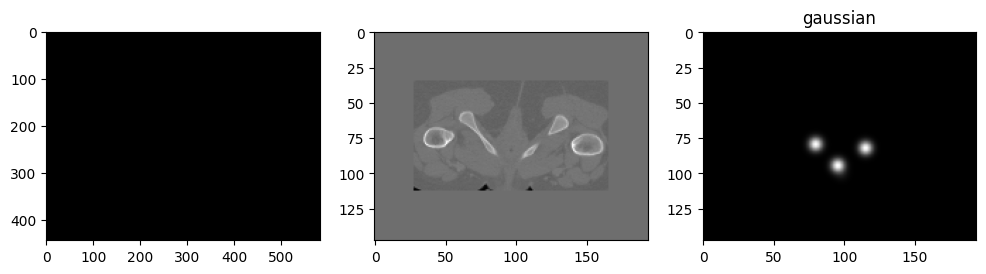

FINAL_SIZES (194, 148, 157) (194, 148, 157)


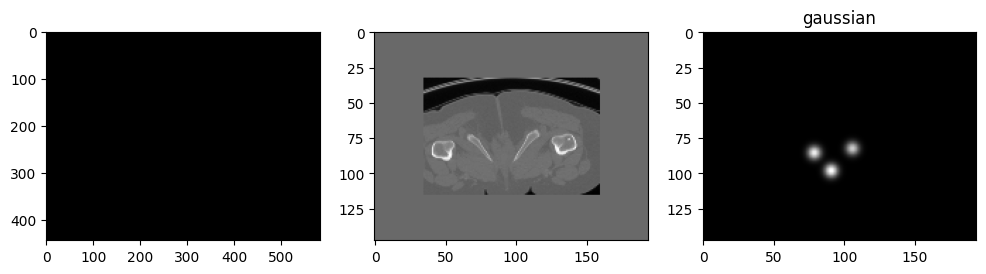

FINAL_SIZES (194, 148, 157) (194, 148, 157)


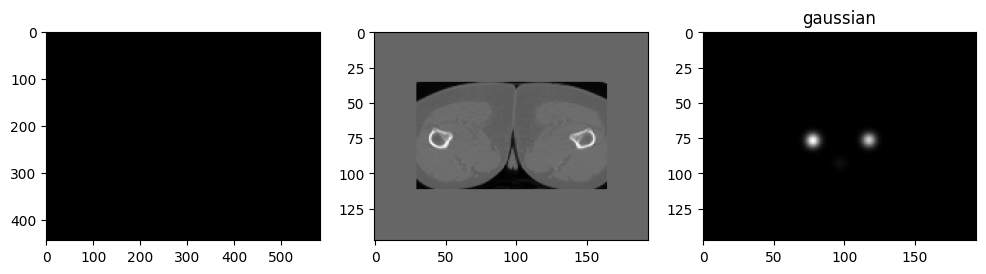

FINAL_SIZES (194, 148, 157) (194, 148, 157)


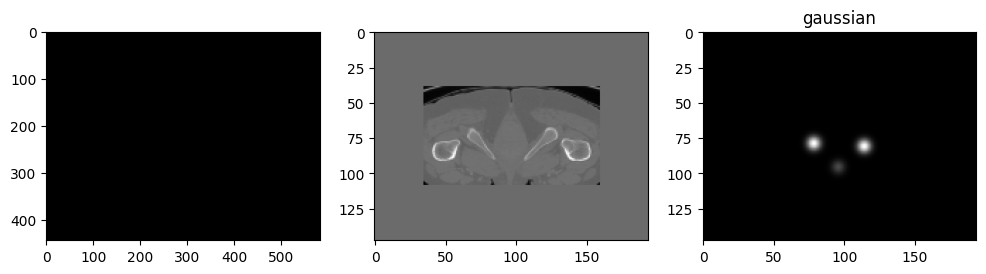

FINAL_SIZES (194, 148, 157) (194, 148, 157)


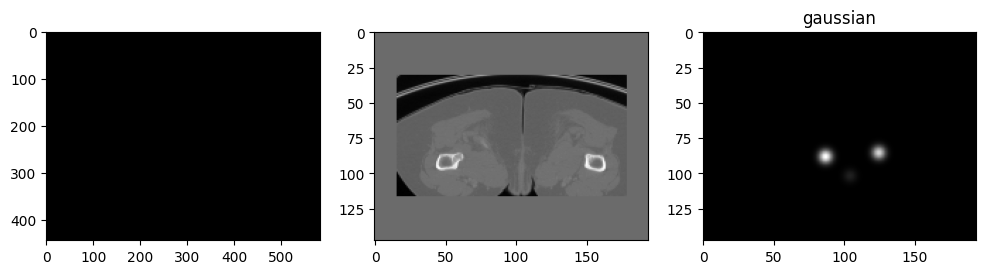

FINAL_SIZES (194, 148, 157) (194, 148, 157)


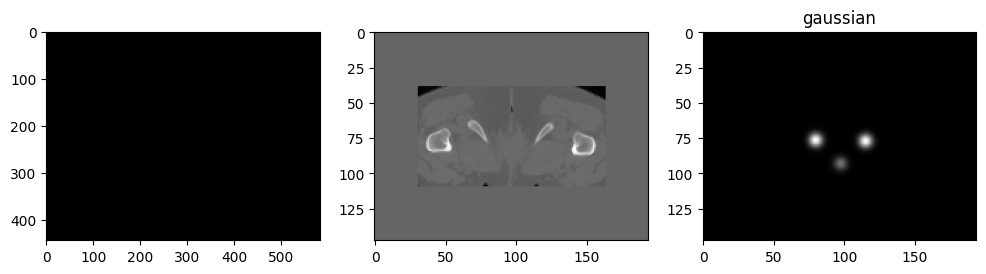

FINAL_SIZES (194, 148, 157) (194, 148, 157)


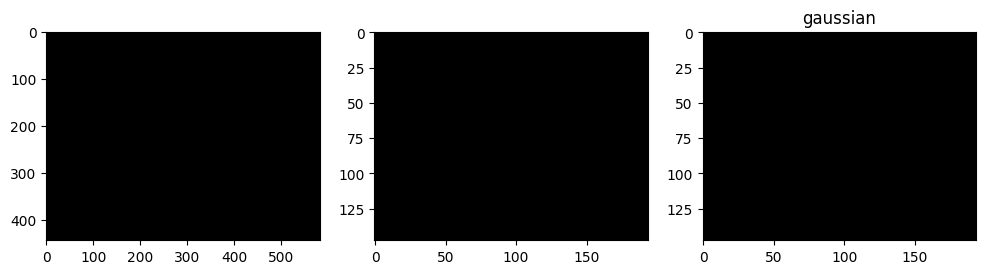

FINAL_SIZES (194, 148, 157) (194, 148, 157)


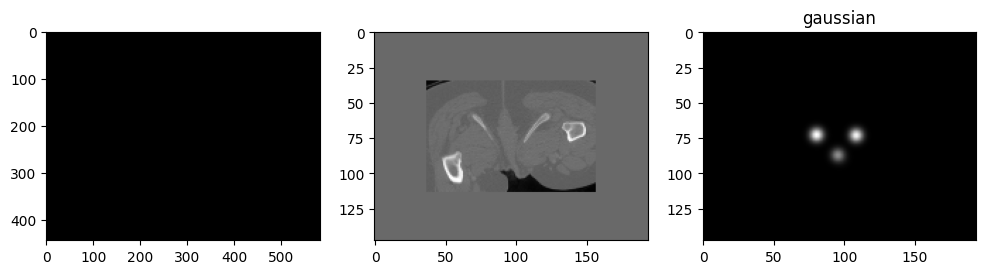

FINAL_SIZES (194, 148, 157) (194, 148, 157)


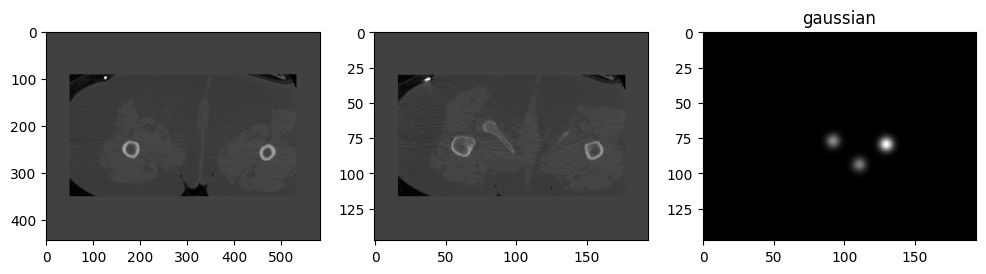

FINAL_SIZES (194, 148, 157) (194, 148, 157)


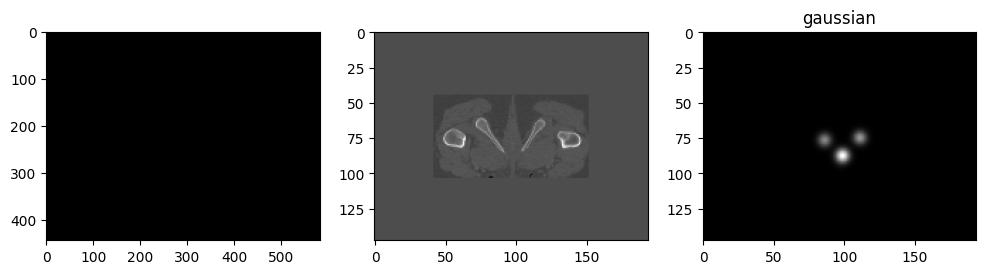

FINAL_SIZES (194, 148, 157) (194, 148, 157)


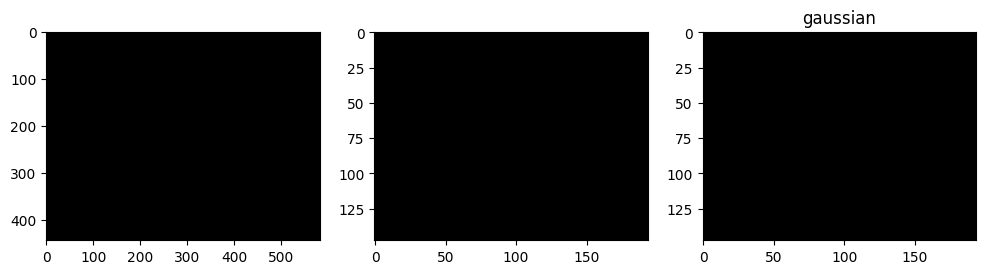

FINAL_SIZES (194, 148, 157) (194, 148, 157)


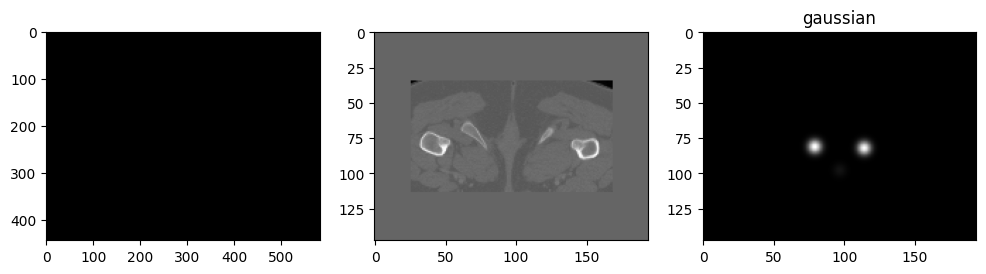

FINAL_SIZES (194, 148, 157) (194, 148, 157)


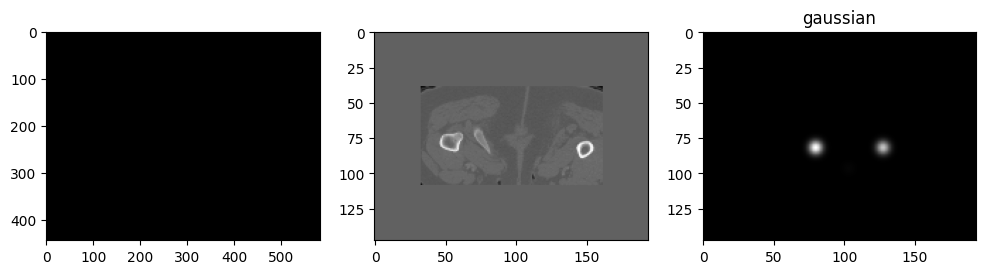

FINAL_SIZES (194, 148, 157) (194, 148, 157)


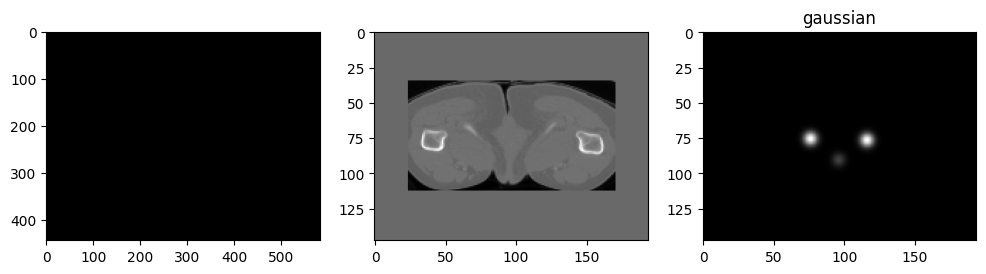

FINAL_SIZES (194, 148, 157) (194, 148, 157)


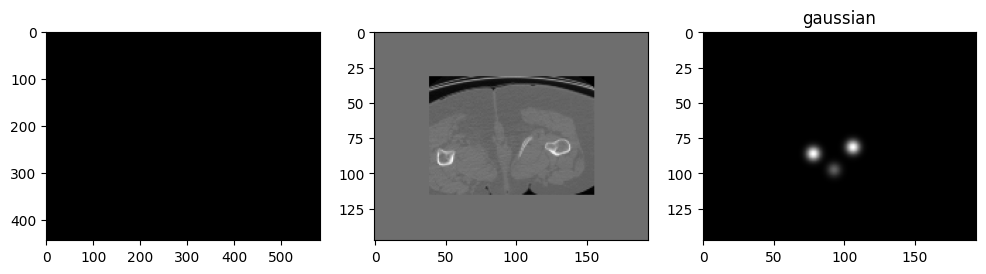

FINAL_SIZES (194, 148, 157) (194, 148, 157)


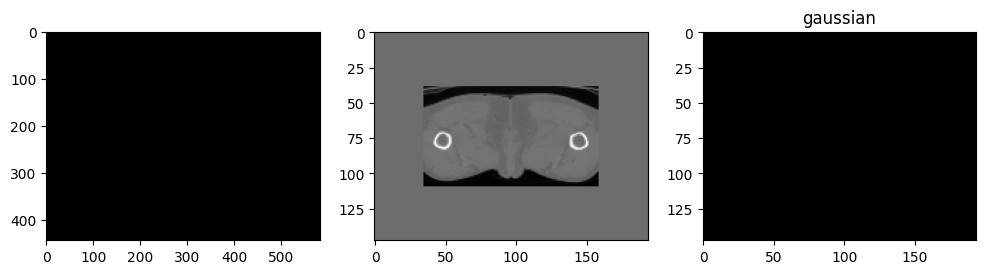

FINAL_SIZES (194, 148, 157) (194, 148, 157)


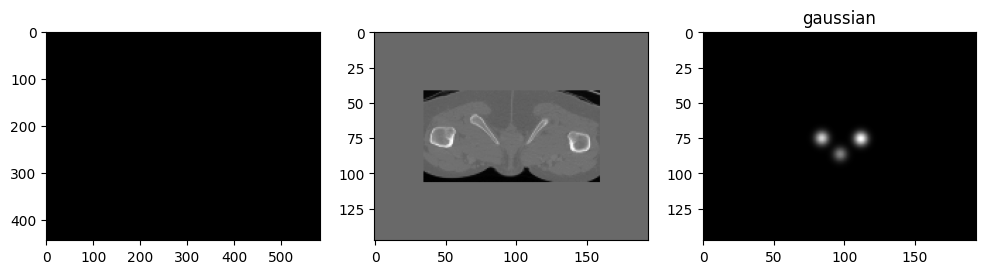

FINAL_SIZES (194, 148, 157) (194, 148, 157)


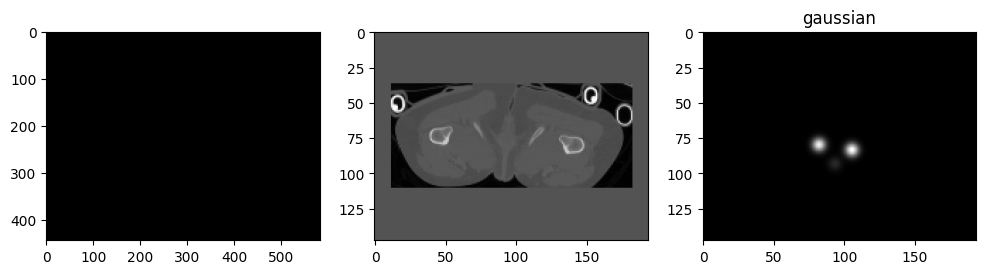

FINAL_SIZES (194, 148, 157) (194, 148, 157)


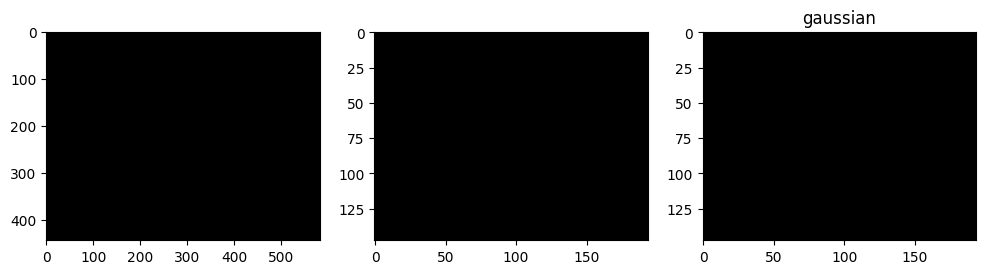

FINAL_SIZES (194, 148, 157) (194, 148, 157)


KeyboardInterrupt: 

In [15]:
for i in range(len(PADDED_IMAGES)):
    image = PADDED_IMAGES[i]
    gaussian = GAUSSIAN_IMAGES[i]
    
    input_size = image.GetSize()
    gaussian_size = gaussian.GetSize()

    # Define the new size of the image with reduced number of slices
    new_size = [input_size[0]//3, input_size[1]//3, input_size[2]//2] 
    new_gauss_size = [gaussian_size[0]//3, gaussian_size[1]//3, gaussian_size[2]//2] 
    
    original_spacing = image.GetSpacing()
    original_gauss_spacing = gaussian.GetSpacing()
    
    new_spacing = [image.GetSpacing()[0]*3, image.GetSpacing()[1]*3, image.GetSpacing()[2]*2] # change "*2" to the inverse of the reduction factor
    new_gauss_spacing = [gaussian.GetSpacing()[0]*3, gaussian.GetSpacing()[1]*3, gaussian.GetSpacing()[2]*2]
    
    final_transformed_resampled = sitk.Resample(image, new_size, sitk.Transform(), sitk.sitkLinear, image.GetOrigin(), new_spacing, image.GetDirection(), 0.0, image.GetPixelID())
    final_gaussian_resampled = sitk.Resample(gaussian, new_gauss_size, sitk.Transform(), sitk.sitkLinear, gaussian.GetOrigin(), new_gauss_spacing, gaussian.GetDirection(), 0.0, gaussian.GetPixelID())
    print('FINAL_SIZES',final_transformed_resampled.GetSize(),final_gaussian_resampled.GetSize())
    
    
    plt.figure(figsize=(12, 6))
                            
    plt.subplot(1, 3, 1)
    # plt.scatter(landmark[0], landmark[1], s=15, c='red', marker='o')
    plt.imshow(sitk.GetArrayFromImage(image)[22, :,:], cmap='gray')
    
    plt.subplot(1, 3, 2)
    # plt.scatter(new_landmark[0], new_landmark[1], s=15, c='red', marker='o')
    
    plt.imshow(sitk.GetArrayFromImage(final_transformed_resampled)[22, :,:], cmap='gray')
    plt.subplot(1, 3, 3)
    # plt.imshow(sitk.GetArrayFromImage(final_transformed_resampled)[int(new_landmarks[0][2]), :,:], cmap='gray')
    # plt.scatter(new_landmark[0], new_landmark[1], s=15, c='red', marker='o')
    
    plt.imshow(sitk.GetArrayFromImage(final_gaussian_resampled)[22, :,:], cmap='gray')
    
    plt.title('gaussian')
    plt.show()
    

P_1765645_GIN.nrrd


IndexError: index 131 is out of bounds for axis 0 with size 81

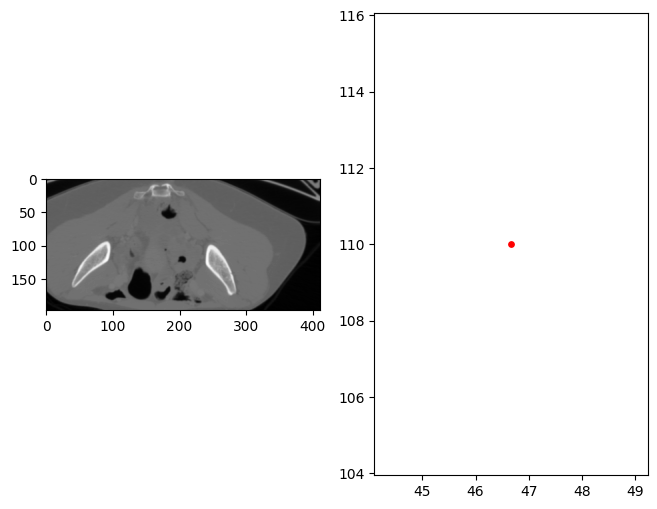

In [9]:
im_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/Cropped_images/"
landmarks_path =  "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_landmarks/"
gaussians_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_gaussians/"
save_im = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded/"
im_list = os.listdir(im_path)

for i in range(len(im_list)):
    image_file = im_list[i]
    print(image_file)
    if (image_file != "padded" and image_file!="padded_landmarks" and image_file!="padded_gaussians"):  
            
        image = sitk.ReadImage(im_path + im_list[i], sitk.sitkFloat32)
        landmarks_filename = f"{os.path.splitext(image_file)[0]}_landmarks.txt"
        landmarks = np.loadtxt(landmarks_path+landmarks_filename)
        # gaussian = sitk.ReadImage(gaussians_path + im_list[i], sitk.sitkFloat32)

        labels = np.array([[value for value in sublist] for sublist in landmarks])
        
        input_size = image.GetSize()
        

        # Define the new size of the image with reduced number of slices
        new_size = [input_size[0]//3, input_size[1]//3, input_size[2]//2] 
        
        original_spacing = image.GetSpacing()
        
        new_spacing = [image.GetSpacing()[0]*3, image.GetSpacing()[1]*3, image.GetSpacing()[2]*2] # change "*2" to the inverse of the reduction factor
        
        final_transformed_resampled = sitk.Resample(image, new_size, sitk.Transform(), sitk.sitkLinear, image.GetOrigin(), new_spacing, image.GetDirection(), 0.0, image.GetPixelID())

        # Escalar las coordenadas de los landmarks ---------------
        valor= ((np.array(labels / np.array((3,3,2)))))
        
        
        # Crear una imagen para mostrar las gaussianas
        gaussian_image = np.zeros(final_transformed_resampled.GetSize())

        for new_landmark in valor:
            gaussian = gaussian_3d(final_transformed_resampled.GetSize(), new_landmark.tolist())
            gaussian = np.transpose(gaussian, (1,0,2))
            
            gaussian_image += gaussian
        gaussian_image = np.transpose(gaussian_image, (2,1,0))    
        # new_landmarks = np.array([[round(value, 2) for value in sublist] for sublist in valor]).reshape(-1)
        # save images
        sitk.WriteImage(final_transformed_resampled, save_im + image_file)
        sitk.WriteImage(sitk.GetImageFromArray(gaussian_image), gaussian_image_path +image_file )
            
        landmark = labels[0]
        
        
        plt.figure(figsize=(12, 6))
                            
        plt.subplot(1, 3, 1)
        plt.scatter(landmark[0], landmark[1], s=15, c='red', marker='o')
        plt.imshow(sitk.GetArrayFromImage(image)[int(landmark[2]), :,:], cmap='gray')
        
        plt.subplot(1, 3, 2)
        plt.scatter(new_landmark[0], new_landmark[1], s=15, c='red', marker='o')
        
        plt.imshow(sitk.GetArrayFromImage(final_transformed_resampled)[int(new_landmark[2]), :,:], cmap='gray')
        plt.subplot(1, 3, 3)
        # plt.imshow(sitk.GetArrayFromImage(final_transformed_resampled)[int(new_landmarks[0][2]), :,:], cmap='gray')
        plt.scatter(new_landmark[0], new_landmark[1], s=15, c='red', marker='o')
        
        plt.imshow((gaussian_image)[int(new_landmark[2]), :,:], cmap='gray')
        
        plt.title('gaussian')
        plt.show()
        
        # sitk.WriteImage(final_transformed_resampled)
        
        

In [ ]:
im_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/Cropped_images/"
landmarks_path =  "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_landmarks/"
gaussians_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_gaussians/"
save_im = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded/"
im_list = os.listdir(im_path)

for i in range(len(im_list)):
    image_file = im_list[i]
    print(image_file)
    if (image_file != "padded" and image_file!="padded_landmarks" and image_file!="padded_gaussians"):  
            
        image = sitk.ReadImage(im_path + im_list[i], sitk.sitkFloat32)
        landmarks_filename = f"{os.path.splitext(image_file)[0]}_landmarks.txt"
        landmarks = np.loadtxt(landmarks_path+landmarks_filename)
        # gaussian = sitk.ReadImage(gaussians_path + im_list[i], sitk.sitkFloat32)

        labels = np.array([[value for value in sublist] for sublist in landmarks])
        
        input_size = image.GetSize()
        

        # Define the new size of the image with reduced number of slices
        new_size = [input_size[0]//3, input_size[1]//3, input_size[2]//2] 
        
        original_spacing = image.GetSpacing()
        
        new_spacing = [image.GetSpacing()[0]*3, image.GetSpacing()[1]*3, image.GetSpacing()[2]*2] # change "*2" to the inverse of the reduction factor
        
        final_transformed_resampled = sitk.Resample(image, new_size, sitk.Transform(), sitk.sitkLinear, image.GetOrigin(), new_spacing, image.GetDirection(), 0.0, image.GetPixelID())

        # Escalar las coordenadas de los landmarks ---------------
        valor= ((np.array(labels / np.array((3,3,2)))))
        
        
        # Crear una imagen para mostrar las gaussianas
        gaussian_image = np.zeros(final_transformed_resampled.GetSize())

        for new_landmark in valor:
            gaussian = gaussian_3d(final_transformed_resampled.GetSize(), new_landmark.tolist())
            gaussian = np.transpose(gaussian, (1,0,2))
            
            gaussian_image += gaussian
        gaussian_image = np.transpose(gaussian_image, (2,1,0))    
        # new_landmarks = np.array([[round(value, 2) for value in sublist] for sublist in valor]).reshape(-1)
        # save images
        sitk.WriteImage(final_transformed_resampled, save_im + image_file)
        sitk.WriteImage(sitk.GetImageFromArray(gaussian_image), gaussian_image_path +image_file )
            
        landmark = labels[0]
        
        
        plt.figure(figsize=(12, 6))
                            
        plt.subplot(1, 3, 1)
        plt.scatter(landmark[0], landmark[1], s=15, c='red', marker='o')
        plt.imshow(sitk.GetArrayFromImage(image)[int(landmark[2]), :,:], cmap='gray')
        
        plt.subplot(1, 3, 2)
        plt.scatter(new_landmark[0], new_landmark[1], s=15, c='red', marker='o')
        
        plt.imshow(sitk.GetArrayFromImage(final_transformed_resampled)[int(new_landmark[2]), :,:], cmap='gray')
        plt.subplot(1, 3, 3)
        # plt.imshow(sitk.GetArrayFromImage(final_transformed_resampled)[int(new_landmarks[0][2]), :,:], cmap='gray')
        plt.scatter(new_landmark[0], new_landmark[1], s=15, c='red', marker='o')
        
        plt.imshow((gaussian_image)[int(new_landmark[2]), :,:], cmap='gray')
        
        plt.title('gaussian')
        plt.show()
        
        # sitk.WriteImage(final_transformed_resampled)
        
        

# Divide data

In [4]:
for i in os.listdir(gaussians):
    im = sitk.ReadImage(gaussians+i,sitk.sitkFloat32)
    print(im.GetSize())

NameError: name 'gaussians' is not defined

In [5]:
import os
images = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded/"
images_names = []
for i in os.listdir(images):
    images_names.append(images + i)

In [6]:
gaussians = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_gaussians/"
gaussians_names = []
for i in os.listdir(gaussians):
    gaussians_names.append(gaussians + i)

In [7]:
from sklearn.model_selection import train_test_split
import pandas as pd

classes = []
for i in range(len(images_names)):
    
    if 'ANTRO' in images_names[i]:
        classes.append(0)
    elif 'ANDR' in images_names[i]:
        classes.append(1)
    elif 'GIN' in images_names[i]:
        classes.append(2)
    elif 'PLAT' in images_names[i]:
        classes.append(3)

print('Total:', pd.DataFrame(classes).value_counts())


X_train, X_test, Y_train, Y_test = train_test_split(images_names, gaussians_names, test_size=0.25, random_state=42, stratify = classes)


Total: 0    37
2    34
1     4
Name: count, dtype: int64


In [8]:
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.25, random_state=42)
y_train = Y_train

classes_train = []
for i in range(len(X_train)):
    if 'ANTRO' in X_train[i]:
        classes_train.append(0)
    elif 'ANDR' in X_train[i]:
        classes_train.append(1)
    elif 'GIN' in X_train[i]:
        classes_train.append(2)
    elif 'PLAT' in X_train[i]:
        classes_train.append(3)
print('\nTrain set:\n', pd.DataFrame(classes_train).value_counts())


classes_val = []
for i in range(len(Y_val)):
    if 'ANTRO' in Y_val[i]:
        classes_val.append(0)
    elif 'ANDR' in Y_val[i]:
        classes_val.append(1)
    elif 'GIN' in Y_val[i]:
        classes_val.append(2)
    elif 'PLAT' in Y_val[i]:
        classes_val.append(3)
print('\nValidation set:\n', pd.DataFrame(classes_val).value_counts())

classes_test = []
for i in range(len(X_test)):
    if 'ANTRO' in X_test[i]:
        classes_test.append(0)
    elif 'ANDR' in X_test[i]:
        classes_test.append(1)
    elif 'GIN' in X_test[i]:
        classes_test.append(2)
    elif 'PLAT' in X_test[i]:
        classes_test.append(3)

print('\nTest set:\n', pd.DataFrame(classes_test).value_counts())



Train set:
 0    21
2    19
1     2
Name: count, dtype: int64

Validation set:
 0    7
2    6
1    1
Name: count, dtype: int64

Test set:
 0    9
2    9
1    1
Name: count, dtype: int64


In [9]:
import shutil
import os

def copiar_imagenes(lista_imagenes, carpeta_destino):
    # Asegurarse de que la carpeta de destino exista
    if not os.path.exists(carpeta_destino):
        os.makedirs(carpeta_destino)

    for imagen in lista_imagenes:
        # Obtener el nombre del archivo
        nombre_archivo = os.path.basename(imagen)
        
        # Construir la ruta de destino
        destino = os.path.join(carpeta_destino, nombre_archivo)

        # Copiar el archivo
        shutil.copy(imagen, destino)


train_imagenes = X_train

carpeta_destino = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/train_files/images/"

copiar_imagenes(train_imagenes, carpeta_destino)


In [10]:


train_gauss= Y_train

carpeta_destino = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/train_files/landmarks/"

copiar_imagenes(train_gauss, carpeta_destino)

In [11]:
val_imagenes = X_val

carpeta_destino = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/val_files/images/"

copiar_imagenes(val_imagenes, carpeta_destino)

In [12]:

val_gaussians = Y_val

carpeta_destino = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/val_files/landmarks/"

copiar_imagenes(val_gaussians, carpeta_destino)

In [13]:
test_imagenes = X_test

carpeta_destino = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/test_files/images/"

copiar_imagenes(test_imagenes, carpeta_destino)

In [14]:
test_gaussians = Y_test

carpeta_destino = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/test_files/landmarks/"

copiar_imagenes(test_gaussians, carpeta_destino)